In [1]:
#step 1 download data

In [2]:
# this download tool requires the installation of 
#     https://github.com/spacetelescope/jwst_mast_query
#
# and having a MAST_API TOKEN
#     https://auth.mast.stsci.edu/token

import os
import subprocess

In [ ]:
token = '**********************************' #replace with real token

os.environ["MAST_API_TOKEN"] = token
return_token = subprocess.check_output('echo $MAST_API_TOKEN',shell=True)

assert token == str(return_token)[2:-3]

In [3]:
DL = 'n'                                                     # y = yes download, n = no don't (for testing)
JWSTDL_path = '/home/amadurowicz/miniconda3/envs/stenv/bin/' # path to jwst_download.py
DL_dir = '/user/amadurowicz/51 Eri/raw/'                     # where to download data

def download():
    date_string = '2024-01-27 2024-02-01'
    
    cmd = """\
    while true; do echo {}; sleep 1; done | \
    '{}jwst_download.py' \
    --propID 3522 \
    --instrument nirspec \
    --filetypes 'uncal' \
    --outrootdir='{}' \
    --date_select {} \
    """.format(DL, JWSTDL_path, DL_dir, date_string)
    
    subprocess.call(cmd,shell=True)

In [4]:
download()

In [5]:
#step 2 proces with jwst pipeline

In [3]:
import jwst
print('JWST pipeline version: {}'.format(jwst.__version__))

from breads.jwst_tools.reduction_utils import find_files_to_process, run_stage1, run_stage2

JWST pipeline version: 1.17.1


In [4]:
numthreads = os.cpu_count()

targetdir = os.getcwd()
uncaldir = os.path.join(targetdir, 'raw') 
print(uncaldir)

crds_dir = '/home/amadurowicz/crds_cache'
os.environ['WEBBPSF_PATH'] = '/home/amadurowicz/webbpsf-data/'
os.environ['CRDS_PATH'] = '/home/amadurowicz/crds_cache'
os.environ['CRDS_SERVER_URL'] = 'https://jwst-crds.stsci.edu'

filename_filter = "jw0352200[7,8]001_0[4,6]10[1,2,4]_000*_uncal.fits"
print(filename_filter)
print('__')

uncal_files = find_files_to_process(uncaldir, filetype=filename_filter)
stage1_outdir = os.path.join(targetdir, 'reduced', "stage1")
stage2_outdir = os.path.join(targetdir,'reduced', "stage2")
#stage2_outdir_noNSyes1f = os.path.join(targetdir,'reduced', "stage2_noNSyes1f")

/user/amadurowicz/51 Eri/raw
jw0352200[7,8]001_0[4,6]10[1,2,4]_000*_uncal.fits
__
Searching in /user/amadurowicz/51 Eri/raw for files matching jw0352200[7,8]001_0[4,6]10[1,2,4]_000*_uncal.fits
	Found 160 input files to process
	jw03522007001_04101_00001_nrs1_uncal.fits
	jw03522007001_04101_00001_nrs2_uncal.fits
	jw03522007001_04101_00002_nrs1_uncal.fits
	jw03522007001_04101_00002_nrs2_uncal.fits
	jw03522007001_04101_00003_nrs1_uncal.fits
	jw03522007001_04101_00003_nrs2_uncal.fits
	jw03522007001_04101_00004_nrs1_uncal.fits
	jw03522007001_04101_00004_nrs2_uncal.fits
	jw03522007001_04101_00005_nrs1_uncal.fits
	jw03522007001_04101_00005_nrs2_uncal.fits
	jw03522007001_04101_00006_nrs1_uncal.fits
	jw03522007001_04101_00006_nrs2_uncal.fits
	jw03522007001_04101_00007_nrs1_uncal.fits
	jw03522007001_04101_00007_nrs2_uncal.fits
	jw03522007001_04101_00008_nrs1_uncal.fits
	jw03522007001_04101_00008_nrs2_uncal.fits
	jw03522007001_04101_00009_nrs1_uncal.fits
	jw03522007001_04101_00009_nrs2_uncal.fits

In [6]:
rate_files = run_stage1(uncal_files, stage1_outdir, overwrite=False, maximum_cores=numthreads)

Stage 1 Processing file 1 of 160.
	Stage 1 Output file jw03522007001_04101_00001_nrs1_rate.fits already exists in output dir;
	skipping jw03522007001_04101_00001_nrs1_uncal.fits.
Stage 1 Processing file 2 of 160.
	Stage 1 Output file jw03522007001_04101_00001_nrs2_rate.fits already exists in output dir;
	skipping jw03522007001_04101_00001_nrs2_uncal.fits.
Stage 1 Processing file 3 of 160.
	Stage 1 Output file jw03522007001_04101_00002_nrs1_rate.fits already exists in output dir;
	skipping jw03522007001_04101_00002_nrs1_uncal.fits.
Stage 1 Processing file 4 of 160.
	Stage 1 Output file jw03522007001_04101_00002_nrs2_rate.fits already exists in output dir;
	skipping jw03522007001_04101_00002_nrs2_uncal.fits.
Stage 1 Processing file 5 of 160.
	Stage 1 Output file jw03522007001_04101_00003_nrs1_rate.fits already exists in output dir;
	skipping jw03522007001_04101_00003_nrs1_uncal.fits.
Stage 1 Processing file 6 of 160.
	Stage 1 Output file jw03522007001_04101_00003_nrs2_rate.fits already e

In [7]:
cal_files = run_stage2(rate_files, stage2_outdir, skip_cubes=True, overwrite=False, nsclean_skip=False)

Stage 2 Processing file 1 of 160.
	Stage 2 Output file jw03522007001_04101_00001_nrs1_cal.fits already exists in output dir;
	skipping jw03522007001_04101_00001_nrs1_rate.fits.
Stage 2 Processing file 2 of 160.
	Stage 2 Output file jw03522007001_04101_00001_nrs2_cal.fits already exists in output dir;
	skipping jw03522007001_04101_00001_nrs2_rate.fits.
Stage 2 Processing file 3 of 160.
	Stage 2 Output file jw03522007001_04101_00002_nrs1_cal.fits already exists in output dir;
	skipping jw03522007001_04101_00002_nrs1_rate.fits.
Stage 2 Processing file 4 of 160.
	Stage 2 Output file jw03522007001_04101_00002_nrs2_cal.fits already exists in output dir;
	skipping jw03522007001_04101_00002_nrs2_rate.fits.
Stage 2 Processing file 5 of 160.
	Stage 2 Output file jw03522007001_04101_00003_nrs1_cal.fits already exists in output dir;
	skipping jw03522007001_04101_00003_nrs1_rate.fits.
Stage 2 Processing file 6 of 160.
	Stage 2 Output file jw03522007001_04101_00003_nrs2_cal.fits already exists in ou

In [ ]:
#stage 1.5 / 1f correction

14333
14333
14333


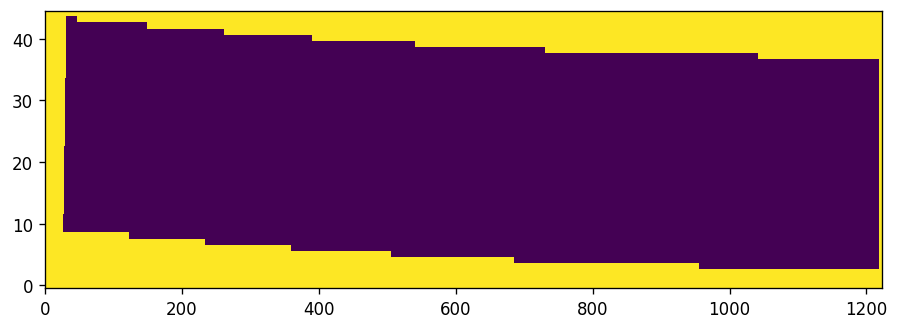

14333
14333
14333


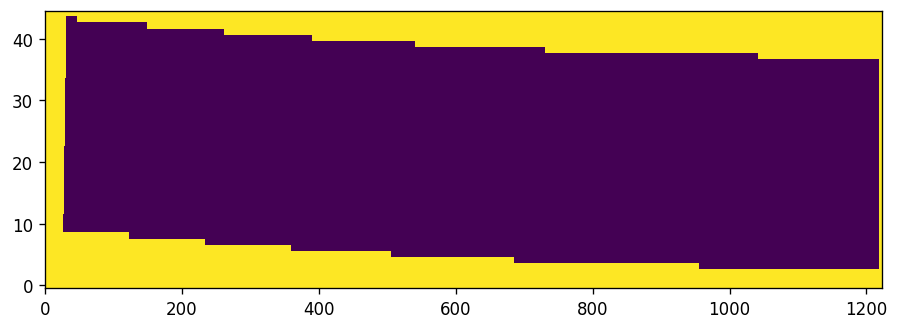

18944
18919
18899


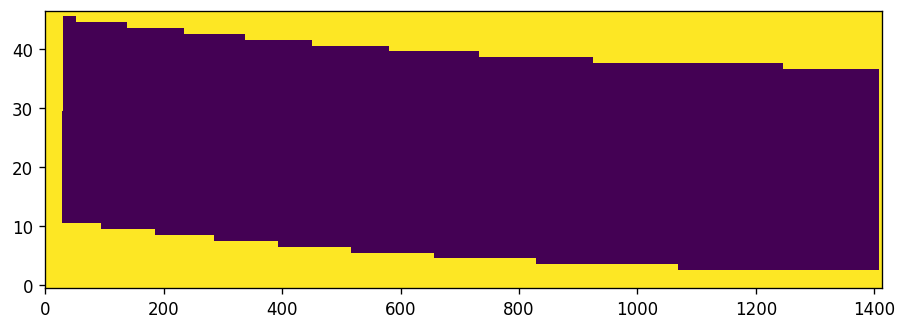

18944
18919
18899


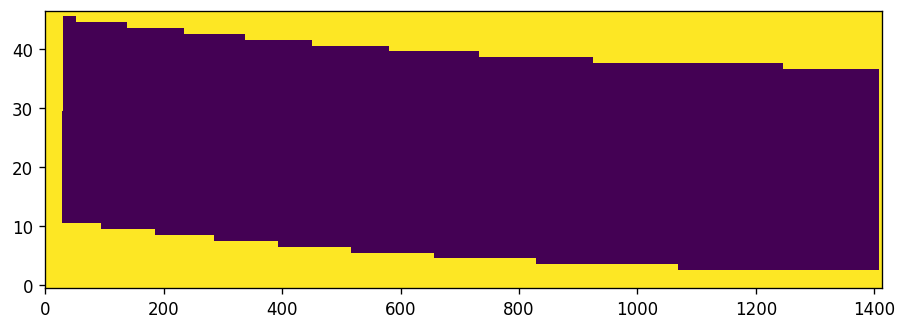

46873
46873
46873


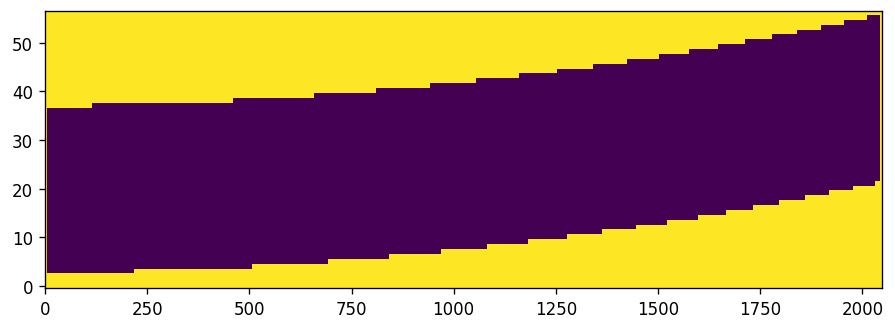

46873
46873
46873


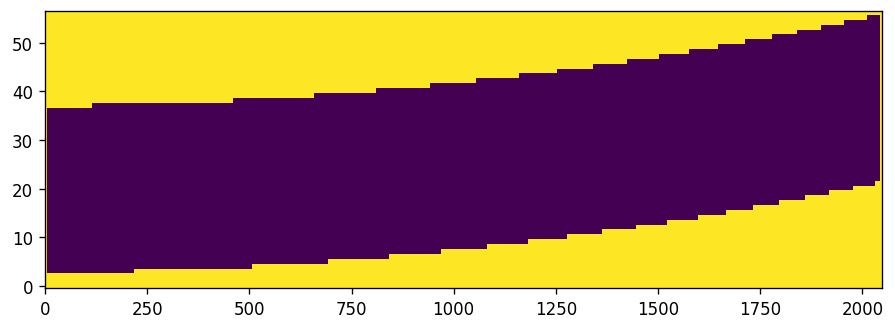

50054
50049
50045


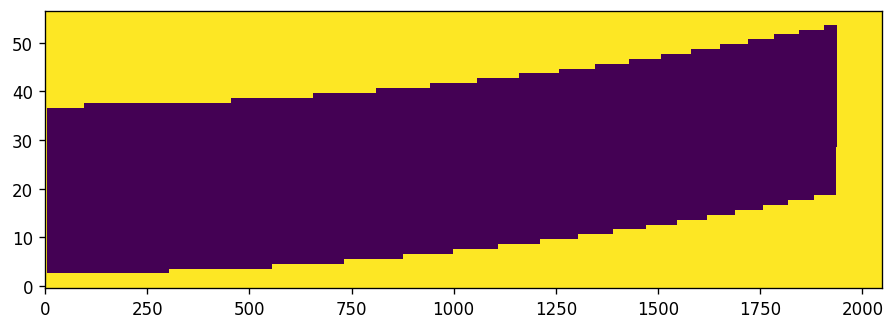

50054
50049
50045


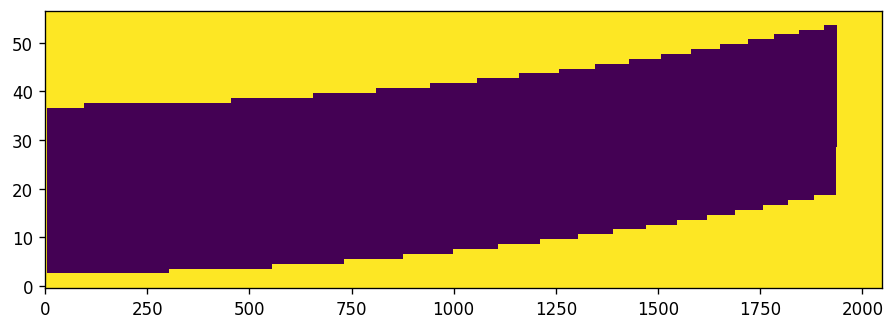

In [15]:
import numpy as np
from astropy.io import fits
import matplotlib.pyplot as plt

a1 = cal_files[0:40:2]
a2 = cal_files[40:80:2]
a3 = cal_files[80:120:2]
a4 = cal_files[120:160:2]

b1 = cal_files[1:41:2]
b2 = cal_files[41:81:2]
b3 = cal_files[81:121:2]
b4 = cal_files[121:161:2]

list_list = [a1,a2,a3,a4,b1,b2,b3,b4]

anynans = []
for flist in list_list:
    dstack = []
    for fname in flist:
        hdu = fits.open(fname)
        d = hdu[1].data
        dstack.append(d)
    
    stacked_data = np.dstack(dstack)
    anynan = np.any(np.isnan(stacked_data),axis=-1)
    anynans.append(anynan)

def clean_anynan(anynan,d):
    # if both neighbors (up and down) or (left and right) at distance d are nan, set the pixel to nan
    # for eliminating bad pixel nans in the map
    J,I = anynan.shape
    for i in range(d,I-d):
        for j in range(d,J-d):
            val = anynan[j,i]
            if val == True:
                #check neighbors
                val_u = anynan[j+d,i]
                val_r = anynan[j,i+d]
                val_d = anynan[j-d,i]
                val_l = anynan[j,i-d]
                RL = int(val_r) + int(val_l)
                UD = int(val_u) + int(val_d)
                if (RL == 0) or (UD == 0):
                    anynan[j,i] = False
    return anynan

for anynan in anynans:

    anynan = clean_anynan(anynan,d=1)
    print(sum(sum(anynan)))
    anynan = clean_anynan(anynan,d=2)
    print(sum(sum(anynan)))
    anynan = clean_anynan(anynan,d=1)
    print(sum(sum(anynan)))
    
    plt.figure(figsize=(9,3),dpi=120)
    plt.imshow(anynan,aspect='auto',interpolation='nearest',origin='lower')
    plt.show()

In [17]:
from scipy.stats import median_abs_deviation as mad

subarray_extents = np.loadtxt('subarray_extents.txt').astype(int)
rate_1f_files = []
for ind,f in enumerate(rate_files):

    newf = stage1_outdir+'.5_noNSyes1f/'+f.split('/')[-1]
    print('{} -> {}'.format(f,newf))
    rate_1f_files.append(newf)
    
    identifier = f.split('/')[-1][:-10]
    print(identifier)
    for li,l in enumerate(list_list):
        for lsub in l:
            if identifier in lsub:
                list_index = li
    print(list_index)
    
    anynan = anynans[list_index]
    xl,xh,yl,yh = subarray_extents[ind,:]
    print(xl,xh,yl,yh)
    
    full_ones = np.ones((64,2048))
    full_ones[yl:yh,xl:xh] = anynan

    hdu = fits.open(f)
    d = hdu[1].data
    masked_data = d*(full_ones)

    ps = []
    empties = []
    for i in range(2048):
        col = masked_data[:,i]
        colmask = full_ones[:,i]
        outmask = np.where(colmask==1)[0]
        x = np.arange(64)
        xtrim = x[outmask]
        trimcol = col[outmask]
        nonan = np.logical_not(np.isnan(trimcol))
        trimcol = trimcol[nonan]
        xtrim = xtrim[nonan]
        hardclip = abs(trimcol)<20
        trimcol = trimcol[hardclip]
        xtrim = xtrim[hardclip]
        if xtrim.size > 0:
            p = np.polyfit(xtrim,trimcol,0)
        else:
            p = [0]
        model = np.poly1d(p)(xtrim)
        residual = trimcol-model
        _mad = mad(residual)
        sigma = 5
        keepboolean = abs(residual) < sigma*_mad
        col2 = trimcol[keepboolean]
        xtrim2 = xtrim[keepboolean]
        if xtrim2.size > 0:
            p = np.polyfit(xtrim2,col2,0)
        else:
            empties.append(i)
            p = [0]
        ps.append(p)
    print('empty: {}'.format(empties))
    const = np.array(ps).reshape(1,2048)
    d_1fcorr = d-const
    hdu[1].data = d_1fcorr
    hdu.writeto(newf,overwrite=True)

/user/amadurowicz/51 Eri/reduced/stage1/jw03522007001_04101_00001_nrs1_rate.fits -> /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00001_nrs1_rate.fits
jw03522007001_04101_00001_nrs1
0
825 2048 8 53
empty: [0, 1, 2, 3, 2043, 2044, 2045, 2046, 2047]
/user/amadurowicz/51 Eri/reduced/stage1/jw03522007001_04101_00001_nrs2_rate.fits -> /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00001_nrs2_rate.fits
jw03522007001_04101_00001_nrs2
4
0 2048 6 63
empty: [0, 1, 2, 3, 4, 2044, 2045, 2046, 2047]
/user/amadurowicz/51 Eri/reduced/stage1/jw03522007001_04101_00002_nrs1_rate.fits -> /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00002_nrs1_rate.fits
jw03522007001_04101_00002_nrs1
0
825 2048 8 53
empty: [0, 1, 2, 3, 2043, 2044, 2045, 2046, 2047]
/user/amadurowicz/51 Eri/reduced/stage1/jw03522007001_04101_00002_nrs2_rate.fits -> /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00002_nrs2_rate.fits
jw0352

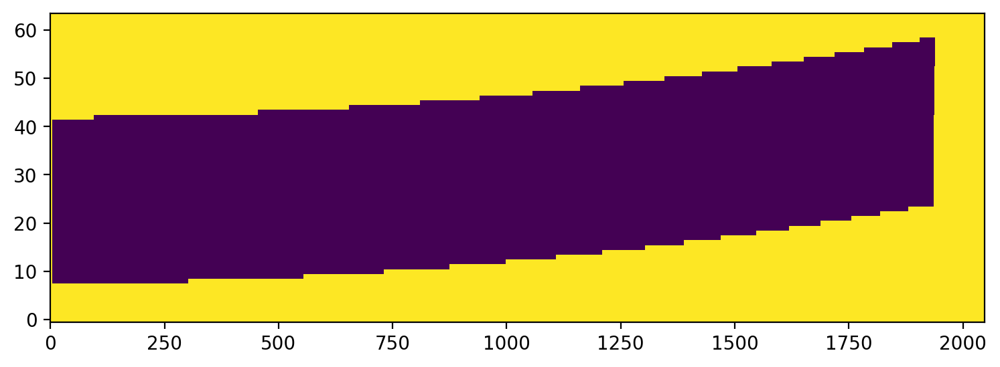

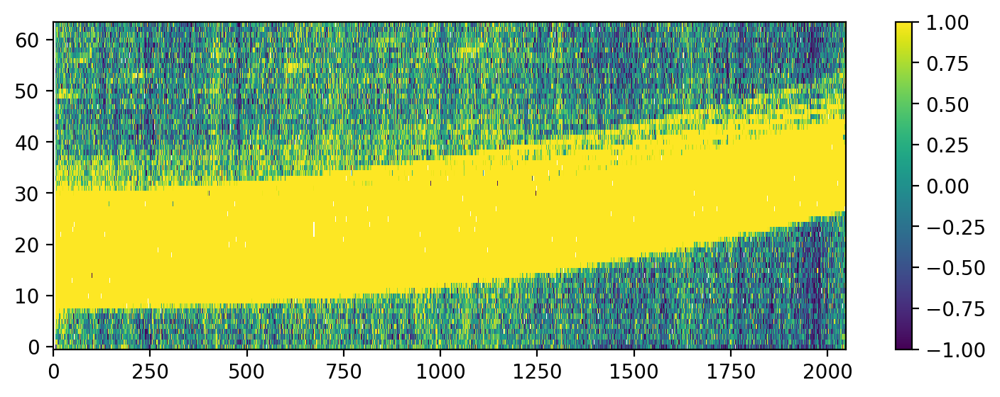

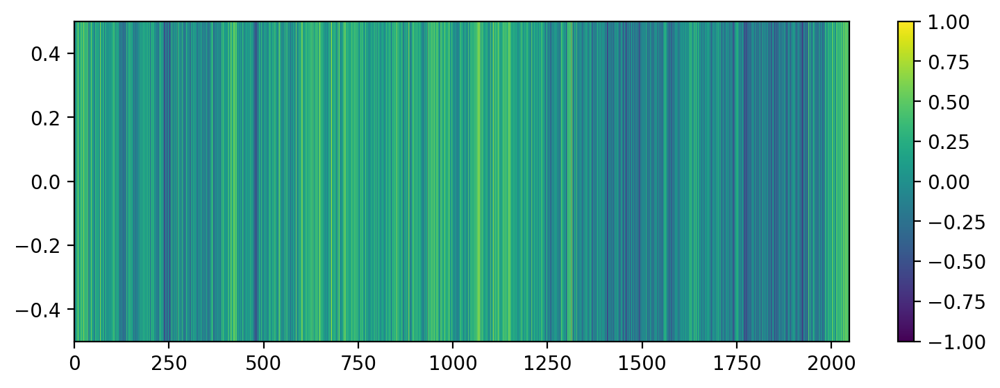

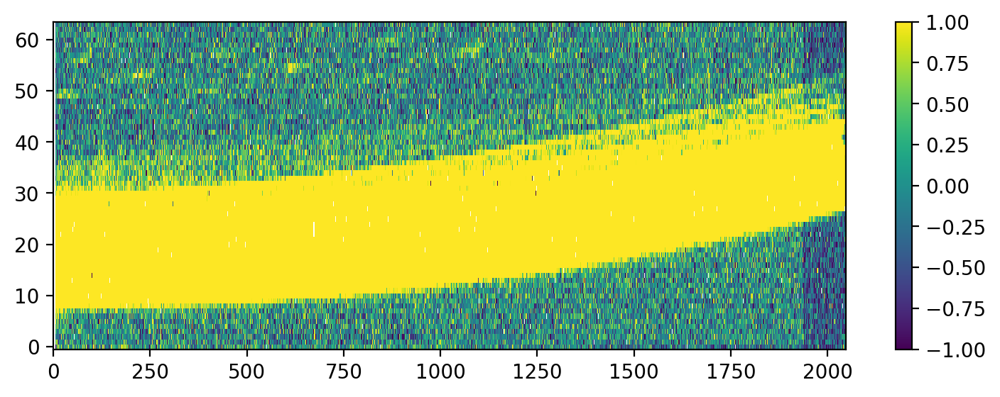

In [18]:
plt.figure(figsize=(9,3),dpi=200)
plt.imshow(full_ones,aspect='auto',interpolation='nearest',origin='lower')

plt.figure(figsize=(9,3),dpi=200)
plt.imshow(d,aspect='auto',interpolation='nearest',origin='lower',vmin=-1,vmax=1)
plt.colorbar()
plt.show()

plt.figure(figsize=(9,3),dpi=200)
plt.imshow(const,aspect='auto',interpolation='nearest',origin='lower',vmin=-1,vmax=1)
plt.colorbar()
plt.show()

plt.figure(figsize=(9,3),dpi=200)
plt.imshow(d_1fcorr,aspect='auto',interpolation='nearest',origin='lower',vmin=-1,vmax=1)
plt.colorbar()
plt.show()

In [19]:
#cal_files = run_stage2(rate_1f_files, stage2_outdir_noNSyes1f, skip_cubes=True, overwrite=False, nsclean_skip=True)

2025-04-03 15:22:36,419 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:22:36,423 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:22:36,426 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:22:36,427 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:22:36,429 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:22:36,430 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:22:36,432 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:22:36,438 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:22:36,447 - stpipe.Spec2Pipeline.master_background_mos - INFO - MasterBackgroundMosStep instance created.
2025-04-03 15:22:36,451 - stpipe.Spec2Pipeline.master_background_mos.flat_field - INF

739405.905179119
0 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00001_nrs1_rate.fits


2025-04-03 15:22:38,575 - stpipe - WARNING - /home/amadurowicz/miniconda3/envs/stenv/lib/python3.11/site-packages/asdf/_entry_points.py:51: AsdfWarning: asdf.resource_mappings plugin from package specutils==1.15.0 failed to load:

AttributeError: module 'dask.array' has no attribute 'core'
  warnings.warn(

2025-04-03 15:22:40,953 - stpipe - WARNING - /home/amadurowicz/miniconda3/envs/stenv/lib/python3.11/site-packages/asdf/_entry_points.py:51: AsdfWarning: asdf.extensions plugin from package specutils==1.15.0 failed to load:

AttributeError: module 'dask.array' has no attribute 'core'
  warnings.warn(

2025-04-03 15:22:41,853 - CRDS - INFO -  Calibration SW Found: jwst 1.17.1 (/home/amadurowicz/miniconda3/envs/stenv/lib/python3.11/site-packages/jwst-1.17.1.dist-info)
2025-04-03 15:22:42,972 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:22:43,036 - stpipe - INFO -

Runtime so far: 21.7427 seconds
1 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00001_nrs2_rate.fits


2025-04-03 15:22:58,335 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:22:58,362 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:22:58,364 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:22:58,365 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:22:58,366 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:22:58,367 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:22:58,368 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:22:58,368 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:22:58,369 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:22:58,374 -

Runtime so far: 41.6289 seconds
2 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00002_nrs1_rate.fits


2025-04-03 15:23:18,234 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:23:18,266 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:23:18,267 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:23:18,268 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:23:18,269 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:23:18,271 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:23:18,272 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:23:18,273 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:23:18,274 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:23:18,278 -

Runtime so far: 51.7222 seconds
3 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00002_nrs2_rate.fits


2025-04-03 15:23:28,312 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:23:28,339 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:23:28,341 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:23:28,342 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:23:28,342 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:23:28,343 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:23:28,344 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:23:28,345 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:23:28,346 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:23:28,350 -

Runtime so far: 65.8149 seconds
4 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00003_nrs1_rate.fits


2025-04-03 15:23:42,686 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:23:42,724 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:23:42,779 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:23:42,785 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:23:42,786 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:23:42,787 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:23:42,788 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:23:42,790 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:23:42,790 - stpipe.Spec2Pipeline.

Runtime so far: 77.4690 seconds
5 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00003_nrs2_rate.fits


2025-04-03 15:23:54,064 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:23:54,099 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:23:54,101 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:23:54,102 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:23:54,103 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:23:54,104 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:23:54,105 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:23:54,106 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:23:54,108 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:23:54,112 -

Runtime so far: 89.7086 seconds
6 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00004_nrs1_rate.fits


2025-04-03 15:24:06,295 - stpipe.Spec2Pipeline.straylight - INFO - StraylightStep instance created.
2025-04-03 15:24:06,296 - stpipe.Spec2Pipeline.fringe - INFO - FringeStep instance created.
2025-04-03 15:24:06,298 - stpipe.Spec2Pipeline.residual_fringe - INFO - ResidualFringeStep instance created.
2025-04-03 15:24:06,303 - stpipe.Spec2Pipeline.pathloss - INFO - PathLossStep instance created.
2025-04-03 15:24:06,310 - stpipe.Spec2Pipeline.barshadow - INFO - BarShadowStep instance created.
2025-04-03 15:24:06,330 - stpipe.Spec2Pipeline.wfss_contam - INFO - WfssContamStep instance created.
2025-04-03 15:24:06,332 - stpipe.Spec2Pipeline.photom - INFO - PhotomStep instance created.
2025-04-03 15:24:06,344 - stpipe.Spec2Pipeline.pixel_replace - INFO - PixelReplaceStep instance created.
2025-04-03 15:24:06,345 - stpipe.Spec2Pipeline.resample_spec - INFO - ResampleSpecStep instance created.
2025-04-03 15:24:06,347 - stpipe.Spec2Pipeline.cube_build - INFO - CubeBuildStep instance created.
202

Runtime so far: 106.0589 seconds
7 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00004_nrs2_rate.fits


2025-04-03 15:24:22,662 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:24:22,691 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:24:22,692 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:24:22,693 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:24:22,694 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:24:22,696 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:24:22,697 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:24:22,697 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:24:22,698 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:24:22,703 -

Runtime so far: 117.6825 seconds
8 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00005_nrs1_rate.fits


2025-04-03 15:24:34,474 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:24:34,523 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:24:34,567 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:24:34,574 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:24:34,576 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:24:34,580 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:24:34,583 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:24:34,585 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:24:34,592 - stpipe.Spec2Pipeline.

Runtime so far: 132.5595 seconds
9 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00005_nrs2_rate.fits


2025-04-03 15:24:49,159 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:24:49,188 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:24:49,189 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:24:49,190 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:24:49,191 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:24:49,193 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:24:49,194 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:24:49,195 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:24:49,195 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:24:49,200 -

Runtime so far: 143.2613 seconds
10 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00006_nrs1_rate.fits


2025-04-03 15:24:59,863 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:24:59,892 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:24:59,894 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:24:59,895 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:24:59,896 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:24:59,897 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:24:59,898 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:24:59,899 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:24:59,900 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:24:59,904 -

Runtime so far: 158.4599 seconds
11 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00006_nrs2_rate.fits


2025-04-03 15:25:15,068 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:25:15,091 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:25:15,121 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:25:15,122 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:25:15,123 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:25:15,124 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:25:15,126 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:25:15,127 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:25:15,128 - stpipe.Spec2Pipeline.

Runtime so far: 169.5108 seconds
12 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00007_nrs1_rate.fits


2025-04-03 15:25:26,096 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:25:26,119 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:25:26,149 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:25:26,151 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:25:26,152 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:25:26,153 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:25:26,154 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:25:26,156 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:25:26,157 - stpipe.Spec2Pipeline.

Runtime so far: 182.3433 seconds
13 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00007_nrs2_rate.fits


2025-04-03 15:25:39,328 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:25:39,374 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:25:39,434 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:25:39,438 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:25:39,441 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:25:39,442 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:25:39,444 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:25:39,447 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:25:39,451 - stpipe.Spec2Pipeline.

Runtime so far: 197.5685 seconds
14 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00008_nrs1_rate.fits


2025-04-03 15:25:54,175 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:25:54,205 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:25:54,207 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:25:54,208 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:25:54,209 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:25:54,210 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:25:54,212 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:25:54,213 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:25:54,214 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:25:54,219 -

Runtime so far: 209.6249 seconds
15 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00008_nrs2_rate.fits


2025-04-03 15:26:06,562 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:26:06,635 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:26:06,700 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:26:06,712 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:26:06,717 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:26:06,719 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:26:06,721 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:26:06,728 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:26:06,731 - stpipe.Spec2Pipeline.

Runtime so far: 223.4734 seconds
16 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00009_nrs1_rate.fits


2025-04-03 15:26:20,066 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:26:20,094 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:26:20,095 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:26:20,096 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:26:20,097 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:26:20,098 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:26:20,099 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:26:20,100 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:26:20,101 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:26:20,106 -

Runtime so far: 233.3556 seconds
17 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00009_nrs2_rate.fits


2025-04-03 15:26:30,103 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:26:30,132 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:26:30,177 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:26:30,180 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:26:30,194 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:26:30,202 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:26:30,209 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:26:30,216 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:26:30,219 - stpipe.Spec2Pipeline.

Runtime so far: 249.0068 seconds
18 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00010_nrs1_rate.fits


2025-04-03 15:26:45,604 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:26:45,625 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:26:45,654 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:26:45,655 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:26:45,656 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:26:45,657 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:26:45,659 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:26:45,660 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:26:45,661 - stpipe.Spec2Pipeline.

Runtime so far: 258.6509 seconds
19 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00010_nrs2_rate.fits


2025-04-03 15:26:55,244 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:26:55,272 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:26:55,274 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:26:55,275 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:26:55,276 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:26:55,277 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:26:55,278 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:26:55,278 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:26:55,279 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:26:55,284 -

Runtime so far: 274.6958 seconds
20 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00011_nrs1_rate.fits


2025-04-03 15:27:11,287 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:27:11,310 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:27:11,340 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:27:11,342 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:27:11,343 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:27:11,344 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:27:11,346 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:27:11,347 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:27:11,348 - stpipe.Spec2Pipeline.

Runtime so far: 286.4508 seconds
21 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00011_nrs2_rate.fits


2025-04-03 15:27:23,055 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:27:23,083 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:27:23,084 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:27:23,085 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:27:23,086 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:27:23,088 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:27:23,089 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:27:23,090 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:27:23,091 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:27:23,095 -

Runtime so far: 303.3500 seconds
22 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00012_nrs1_rate.fits


2025-04-03 15:27:40,028 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:27:40,051 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:27:40,083 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:27:40,085 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:27:40,086 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:27:40,086 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:27:40,088 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:27:40,089 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:27:40,090 - stpipe.Spec2Pipeline.

Runtime so far: 314.0291 seconds
23 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00012_nrs2_rate.fits


2025-04-03 15:27:50,634 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:27:50,663 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:27:50,664 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:27:50,665 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:27:50,666 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:27:50,667 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:27:50,668 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:27:50,669 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:27:50,670 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:27:50,675 -

Runtime so far: 328.2331 seconds
24 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00013_nrs1_rate.fits


2025-04-03 15:28:05,266 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:28:05,316 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:28:05,390 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:28:05,404 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:28:05,407 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:28:05,409 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:28:05,411 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:28:05,417 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:28:05,419 - stpipe.Spec2Pipeline.

Runtime so far: 340.8516 seconds
25 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00013_nrs2_rate.fits


2025-04-03 15:28:17,457 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:28:17,486 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:28:17,487 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:28:17,488 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:28:17,489 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:28:17,490 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:28:17,491 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:28:17,492 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:28:17,493 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:28:17,497 -

Runtime so far: 353.2669 seconds
26 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00014_nrs1_rate.fits


2025-04-03 15:28:29,858 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.
2025-04-03 15:28:30,279 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:28:30,326 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:28:30,386 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:28:30,388 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:28:30,389 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:28:30,392 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:28:30,395 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:28:30,396 - stpipe.Spec2Pipeline.bkg

Runtime so far: 367.9280 seconds
27 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00014_nrs2_rate.fits


2025-04-03 15:28:44,532 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:28:44,561 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:28:44,563 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:28:44,564 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:28:44,565 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:28:44,567 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:28:44,568 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:28:44,569 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:28:44,570 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:28:44,575 -

Runtime so far: 378.7859 seconds
28 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00015_nrs1_rate.fits


2025-04-03 15:28:55,405 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:28:55,438 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:28:55,481 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:28:55,483 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:28:55,485 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:28:55,486 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:28:55,488 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:28:55,489 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:28:55,492 - stpipe.Spec2Pipeline.

Runtime so far: 394.0670 seconds
29 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00015_nrs2_rate.fits


2025-04-03 15:29:10,663 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:29:10,686 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:29:10,718 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:29:10,720 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:29:10,721 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:29:10,722 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:29:10,724 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:29:10,725 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:29:10,726 - stpipe.Spec2Pipeline.

Runtime so far: 405.2890 seconds
30 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00016_nrs1_rate.fits


2025-04-03 15:29:21,890 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:29:21,921 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:29:21,922 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:29:21,923 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:29:21,924 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:29:21,925 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:29:21,926 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:29:21,927 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:29:21,928 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:29:21,932 -

Runtime so far: 419.6483 seconds
31 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00016_nrs2_rate.fits


2025-04-03 15:29:36,472 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:29:36,501 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:29:36,553 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:29:36,554 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:29:36,557 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:29:36,558 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:29:36,561 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:29:36,563 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:29:36,564 - stpipe.Spec2Pipeline.

Runtime so far: 431.1966 seconds
32 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00017_nrs1_rate.fits


2025-04-03 15:29:47,801 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:29:47,833 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:29:47,834 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:29:47,836 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:29:47,836 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:29:47,838 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:29:47,839 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:29:47,841 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:29:47,842 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:29:47,847 -

Runtime so far: 443.3211 seconds
33 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00017_nrs2_rate.fits


2025-04-03 15:30:00,257 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:30:00,305 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:30:00,355 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:30:00,367 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:30:00,375 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:30:00,378 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:30:00,380 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:30:00,382 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:30:00,390 - stpipe.Spec2Pipeline.

Runtime so far: 457.7593 seconds
34 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00018_nrs1_rate.fits


2025-04-03 15:30:14,357 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:30:14,387 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:30:14,388 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:30:14,389 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:30:14,390 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:30:14,391 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:30:14,392 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:30:14,393 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:30:14,394 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:30:14,399 -

Runtime so far: 467.7262 seconds
35 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00018_nrs2_rate.fits


2025-04-03 15:30:24,415 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:30:24,450 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:30:24,504 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:30:24,509 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:30:24,511 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:30:24,514 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:30:24,516 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:30:24,517 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:30:24,520 - stpipe.Spec2Pipeline.

Runtime so far: 482.5161 seconds
36 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00019_nrs1_rate.fits


2025-04-03 15:30:39,114 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:30:39,142 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:30:39,143 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:30:39,144 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:30:39,145 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:30:39,146 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:30:39,148 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:30:39,148 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:30:39,150 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:30:39,154 -

Runtime so far: 492.3201 seconds
37 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00019_nrs2_rate.fits


2025-04-03 15:30:48,918 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:30:48,946 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:30:48,948 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:30:48,949 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:30:48,949 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:30:48,950 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:30:48,952 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:30:48,953 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:30:48,954 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:30:48,959 -

Runtime so far: 506.9797 seconds
38 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00020_nrs1_rate.fits


2025-04-03 15:31:03,922 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:31:03,966 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:31:04,018 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:31:04,024 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:31:04,026 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:31:04,027 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:31:04,031 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:31:04,032 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:31:04,034 - stpipe.Spec2Pipeline.

Runtime so far: 517.7008 seconds
39 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_04101_00020_nrs2_rate.fits


2025-04-03 15:31:14,300 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:31:14,329 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:31:14,331 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:31:14,332 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:31:14,332 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:31:14,333 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:31:14,335 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:31:14,336 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:31:14,337 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:31:14,341 -

Runtime so far: 529.9454 seconds
40 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00001_nrs1_rate.fits


2025-04-03 15:31:26,966 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:31:27,016 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:31:27,100 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:31:27,104 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:31:27,106 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:31:27,107 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:31:27,116 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:31:27,117 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:31:27,133 - stpipe.Spec2Pipeline.

Runtime so far: 543.9107 seconds
41 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00001_nrs2_rate.fits


2025-04-03 15:31:40,497 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:31:40,517 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:31:40,545 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:31:40,546 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:31:40,547 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:31:40,548 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:31:40,549 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:31:40,551 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:31:40,551 - stpipe.Spec2Pipeline.

Runtime so far: 554.5811 seconds
42 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00002_nrs1_rate.fits


2025-04-03 15:31:51,269 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:31:51,297 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:31:51,332 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:31:51,335 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:31:51,336 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:31:51,339 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:31:51,341 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:31:51,342 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:31:51,344 - stpipe.Spec2Pipeline.

Runtime so far: 569.4089 seconds
43 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00002_nrs2_rate.fits


2025-04-03 15:32:06,004 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:32:06,032 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:32:06,034 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:32:06,035 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:32:06,036 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:32:06,036 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:32:06,038 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:32:06,039 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:32:06,039 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:32:06,044 -

Runtime so far: 580.1259 seconds
44 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00003_nrs1_rate.fits


2025-04-03 15:32:16,720 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:32:16,748 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:32:16,750 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:32:16,751 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:32:16,751 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:32:16,753 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:32:16,754 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:32:16,754 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:32:16,755 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:32:16,760 -

Runtime so far: 595.7678 seconds
45 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00003_nrs2_rate.fits


2025-04-03 15:32:32,510 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:32:32,543 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:32:32,587 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:32:32,591 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:32:32,596 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:32:32,602 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:32:32,609 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:32:32,614 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:32:32,616 - stpipe.Spec2Pipeline.

Runtime so far: 610.0400 seconds
46 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00004_nrs1_rate.fits


2025-04-03 15:32:46,632 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:32:46,659 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:32:46,699 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:32:46,701 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:32:46,702 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:32:46,703 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:32:46,704 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:32:46,705 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:32:46,706 - stpipe.Spec2Pipeline.

Runtime so far: 625.2534 seconds
47 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00004_nrs2_rate.fits


2025-04-03 15:33:01,847 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:33:01,870 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:33:01,901 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:33:01,903 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:33:01,905 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:33:01,905 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:33:01,907 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:33:01,908 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:33:01,909 - stpipe.Spec2Pipeline.

Runtime so far: 637.1141 seconds
48 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00005_nrs1_rate.fits


2025-04-03 15:33:13,711 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:33:13,740 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:33:13,742 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:33:13,743 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:33:13,745 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:33:13,746 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:33:13,749 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:33:13,750 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:33:13,751 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:33:13,756 -

Runtime so far: 651.1457 seconds
49 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00005_nrs2_rate.fits


2025-04-03 15:33:28,029 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:33:28,107 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:33:28,278 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:33:28,280 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:33:28,283 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:33:28,285 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:33:28,289 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:33:28,292 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:33:28,294 - stpipe.Spec2Pipeline.

Runtime so far: 665.5198 seconds
50 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00006_nrs1_rate.fits


2025-04-03 15:33:42,115 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:33:42,143 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:33:42,145 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:33:42,146 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:33:42,147 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:33:42,148 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:33:42,149 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:33:42,150 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:33:42,150 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:33:42,155 -

Runtime so far: 681.2912 seconds
51 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00006_nrs2_rate.fits


2025-04-03 15:33:58,265 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:33:58,304 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:33:58,343 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:33:58,348 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:33:58,349 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:33:58,350 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:33:58,351 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:33:58,352 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:33:58,354 - stpipe.Spec2Pipeline.

Runtime so far: 693.3314 seconds
52 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00007_nrs1_rate.fits


2025-04-03 15:34:09,936 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:34:09,964 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:34:09,966 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:34:09,967 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:34:09,968 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:34:09,969 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:34:09,970 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:34:09,971 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:34:09,972 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:34:09,976 -

Runtime so far: 705.4694 seconds
53 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00007_nrs2_rate.fits


2025-04-03 15:34:22,429 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:34:22,474 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:34:22,550 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:34:22,552 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:34:22,553 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:34:22,555 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:34:22,558 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:34:22,563 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:34:22,566 - stpipe.Spec2Pipeline.

Runtime so far: 720.9263 seconds
54 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00008_nrs1_rate.fits


2025-04-03 15:34:37,510 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:34:37,532 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:34:37,561 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:34:37,562 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:34:37,564 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:34:37,564 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:34:37,566 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:34:37,567 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:34:37,568 - stpipe.Spec2Pipeline.

Runtime so far: 731.3666 seconds
55 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00008_nrs2_rate.fits


2025-04-03 15:34:48,133 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:34:48,163 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:34:48,198 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:34:48,200 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:34:48,201 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:34:48,204 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:34:48,206 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:34:48,208 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:34:48,209 - stpipe.Spec2Pipeline.

Runtime so far: 748.8643 seconds
56 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00009_nrs1_rate.fits


2025-04-03 15:35:05,457 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:35:05,479 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:35:05,509 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:35:05,510 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:35:05,511 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:35:05,512 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:35:05,514 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:35:05,515 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:35:05,516 - stpipe.Spec2Pipeline.

Runtime so far: 759.7346 seconds
57 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00009_nrs2_rate.fits


2025-04-03 15:35:16,502 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:35:16,532 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:35:16,578 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:35:16,581 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:35:16,582 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:35:16,584 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:35:16,586 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:35:16,588 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:35:16,589 - stpipe.Spec2Pipeline.

Runtime so far: 777.0809 seconds
58 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00010_nrs1_rate.fits


2025-04-03 15:35:33,686 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:35:33,715 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:35:33,717 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:35:33,718 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:35:33,719 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:35:33,721 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:35:33,722 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:35:33,723 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:35:33,724 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:35:33,728 -

Runtime so far: 787.0971 seconds
59 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00010_nrs2_rate.fits


2025-04-03 15:35:43,696 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:35:43,724 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:35:43,726 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:35:43,727 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:35:43,727 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:35:43,728 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:35:43,730 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:35:43,731 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:35:43,732 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:35:43,736 -

Runtime so far: 802.2084 seconds
60 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00011_nrs1_rate.fits


2025-04-03 15:35:58,809 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:35:58,841 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:35:58,843 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:35:58,844 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:35:58,845 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:35:58,846 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:35:58,848 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:35:58,849 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:35:58,850 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:35:58,854 -

Runtime so far: 812.4318 seconds
61 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00011_nrs2_rate.fits


2025-04-03 15:36:09,032 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:36:09,060 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:36:09,062 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:36:09,063 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:36:09,064 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:36:09,066 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:36:09,067 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:36:09,068 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:36:09,070 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:36:09,075 -

Runtime so far: 827.5432 seconds
62 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00012_nrs1_rate.fits


2025-04-03 15:36:24,325 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:36:24,360 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:36:24,399 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:36:24,402 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:36:24,403 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:36:24,405 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:36:24,407 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:36:24,408 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:36:24,410 - stpipe.Spec2Pipeline.

Runtime so far: 838.4182 seconds
63 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00012_nrs2_rate.fits


2025-04-03 15:36:35,010 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:36:35,038 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:36:35,039 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:36:35,040 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:36:35,041 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:36:35,042 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:36:35,043 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:36:35,044 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:36:35,045 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:36:35,050 -

Runtime so far: 852.1934 seconds
64 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00013_nrs1_rate.fits


2025-04-03 15:36:49,129 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:36:49,195 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:36:49,289 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:36:49,294 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:36:49,297 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:36:49,298 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:36:49,299 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:36:49,302 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:36:49,302 - stpipe.Spec2Pipeline.

Runtime so far: 866.5500 seconds
65 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00013_nrs2_rate.fits


2025-04-03 15:37:03,140 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:37:03,163 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:37:03,193 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:37:03,195 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:37:03,197 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:37:03,198 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:37:03,200 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:37:03,201 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:37:03,202 - stpipe.Spec2Pipeline.

Runtime so far: 881.6053 seconds
66 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00014_nrs1_rate.fits


2025-04-03 15:37:18,479 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:37:18,511 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:37:18,579 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:37:18,589 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:37:18,590 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:37:18,592 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:37:18,594 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:37:18,596 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:37:18,598 - stpipe.Spec2Pipeline.

Runtime so far: 894.8959 seconds
67 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00014_nrs2_rate.fits


2025-04-03 15:37:31,481 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:37:31,504 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:37:31,534 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:37:31,536 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:37:31,537 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:37:31,538 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:37:31,539 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:37:31,540 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:37:31,541 - stpipe.Spec2Pipeline.

Runtime so far: 908.7920 seconds
68 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00015_nrs1_rate.fits


2025-04-03 15:37:45,380 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.
2025-04-03 15:37:45,959 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:37:46,025 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:37:46,111 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:37:46,115 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:37:46,117 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:37:46,122 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:37:46,127 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:37:46,134 - stpipe.Spec2Pipeline.bkg

Runtime so far: 923.7813 seconds
69 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00015_nrs2_rate.fits


2025-04-03 15:38:00,367 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:38:00,390 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:38:00,422 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:38:00,424 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:38:00,425 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:38:00,426 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:38:00,427 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:38:00,429 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:38:00,430 - stpipe.Spec2Pipeline.

Runtime so far: 936.5664 seconds
70 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00016_nrs1_rate.fits


2025-04-03 15:38:13,645 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:38:13,701 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:38:13,810 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:38:13,813 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:38:13,815 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:38:13,819 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:38:13,821 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:38:13,823 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:38:13,824 - stpipe.Spec2Pipeline.

Runtime so far: 951.8793 seconds
71 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00016_nrs2_rate.fits


2025-04-03 15:38:28,479 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:38:28,508 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:38:28,510 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:38:28,511 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:38:28,512 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:38:28,513 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:38:28,515 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:38:28,515 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:38:28,516 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:38:28,521 -

Runtime so far: 963.6431 seconds
72 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00017_nrs1_rate.fits


2025-04-03 15:38:40,367 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:38:40,403 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:38:40,460 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:38:40,464 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:38:40,467 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:38:40,469 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:38:40,471 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:38:40,474 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:38:40,476 - stpipe.Spec2Pipeline.

Runtime so far: 980.8911 seconds
73 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00017_nrs2_rate.fits


2025-04-03 15:38:57,514 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:38:57,546 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:38:57,549 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:38:57,550 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:38:57,551 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:38:57,552 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:38:57,553 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:38:57,554 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:38:57,555 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:38:57,561 -

Runtime so far: 993.3367 seconds
74 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00018_nrs1_rate.fits


2025-04-03 15:39:10,104 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:39:10,134 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:39:10,188 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:39:10,191 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:39:10,194 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:39:10,197 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:39:10,202 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:39:10,205 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:39:10,206 - stpipe.Spec2Pipeline.

Runtime so far: 1008.6562 seconds
75 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00018_nrs2_rate.fits


2025-04-03 15:39:25,255 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:39:25,283 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:39:25,285 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:39:25,286 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:39:25,287 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:39:25,288 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:39:25,289 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:39:25,290 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:39:25,291 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:39:25,295 -

Runtime so far: 1020.0421 seconds
76 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00019_nrs1_rate.fits


2025-04-03 15:39:36,695 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:39:36,725 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:39:36,761 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:39:36,764 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:39:36,765 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:39:36,767 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:39:36,769 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:39:36,771 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:39:36,772 - stpipe.Spec2Pipeline.

Runtime so far: 1034.8622 seconds
77 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00019_nrs2_rate.fits


2025-04-03 15:39:51,447 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:39:51,470 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:39:51,502 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:39:51,503 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:39:51,504 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:39:51,505 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:39:51,507 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:39:51,508 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:39:51,509 - stpipe.Spec2Pipeline.

Runtime so far: 1046.3566 seconds
78 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00020_nrs1_rate.fits


2025-04-03 15:40:02,957 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:40:02,987 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:40:02,989 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:40:02,990 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:40:02,990 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:40:02,991 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:40:02,993 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:40:02,994 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:40:02,995 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:40:03,000 -

Runtime so far: 1061.5460 seconds
79 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522007001_06101_00020_nrs2_rate.fits


2025-04-03 15:40:18,151 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:40:18,180 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:40:18,182 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:40:18,183 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:40:18,184 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:40:18,185 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:40:18,186 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:40:18,187 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:40:18,188 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:40:18,192 -

Runtime so far: 1072.7166 seconds
80 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00001_nrs1_rate.fits


2025-04-03 15:40:29,322 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:40:29,353 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:40:29,355 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:40:29,356 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:40:29,356 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:40:29,358 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:40:29,359 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:40:29,360 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:40:29,361 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:40:29,366 -

Runtime so far: 1088.1424 seconds
81 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00001_nrs2_rate.fits


2025-04-03 15:40:44,772 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:40:44,806 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:40:44,841 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:40:44,843 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:40:44,844 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:40:44,845 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:40:44,848 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:40:44,849 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:40:44,849 - stpipe.Spec2Pipeline.

Runtime so far: 1100.0051 seconds
82 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00002_nrs1_rate.fits


2025-04-03 15:40:56,606 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:40:56,636 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:40:56,637 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:40:56,638 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:40:56,639 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:40:56,640 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:40:56,641 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:40:56,643 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:40:56,643 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:40:56,648 -

Runtime so far: 1113.9445 seconds
83 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00002_nrs2_rate.fits


2025-04-03 15:41:10,847 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:41:10,891 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:41:10,951 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:41:10,957 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:41:10,959 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:41:10,960 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:41:10,965 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:41:10,967 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:41:10,969 - stpipe.Spec2Pipeline.

Runtime so far: 1129.0993 seconds
84 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00003_nrs1_rate.fits


2025-04-03 15:41:25,700 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:41:25,731 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:41:25,732 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:41:25,733 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:41:25,734 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:41:25,735 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:41:25,737 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:41:25,738 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:41:25,739 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:41:25,743 -

Runtime so far: 1141.0829 seconds
85 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00003_nrs2_rate.fits


2025-04-03 15:41:37,888 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:41:37,946 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:41:37,999 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:41:38,004 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:41:38,006 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:41:38,008 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:41:38,010 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:41:38,013 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:41:38,014 - stpipe.Spec2Pipeline.

Runtime so far: 1154.4005 seconds
86 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00004_nrs1_rate.fits


2025-04-03 15:41:50,996 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:41:51,025 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:41:51,026 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:41:51,027 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:41:51,028 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:41:51,029 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:41:51,030 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:41:51,031 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:41:51,032 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:41:51,036 -

Runtime so far: 1165.2239 seconds
87 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00004_nrs2_rate.fits


2025-04-03 15:42:02,070 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:42:02,100 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:42:02,160 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:42:02,161 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:42:02,163 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:42:02,170 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:42:02,172 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:42:02,173 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:42:02,175 - stpipe.Spec2Pipeline.

Runtime so far: 1181.4628 seconds
88 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00005_nrs1_rate.fits


2025-04-03 15:42:18,055 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:42:18,083 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:42:18,084 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:42:18,085 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:42:18,087 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:42:18,088 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:42:18,089 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:42:18,090 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:42:18,091 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:42:18,095 -

Runtime so far: 1192.3577 seconds
89 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00005_nrs2_rate.fits


2025-04-03 15:42:29,177 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:42:29,212 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:42:29,269 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:42:29,274 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:42:29,276 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:42:29,278 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:42:29,282 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:42:29,283 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:42:29,288 - stpipe.Spec2Pipeline.

Runtime so far: 1208.9423 seconds
90 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00006_nrs1_rate.fits


2025-04-03 15:42:45,529 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:42:45,552 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:42:45,583 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:42:45,585 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:42:45,586 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:42:45,587 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:42:45,588 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:42:45,589 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:42:45,590 - stpipe.Spec2Pipeline.

Runtime so far: 1219.5213 seconds
91 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00006_nrs2_rate.fits


2025-04-03 15:42:56,115 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:42:56,143 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:42:56,144 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:42:56,145 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:42:56,146 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:42:56,147 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:42:56,148 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:42:56,149 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:42:56,150 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:42:56,154 -

Runtime so far: 1235.8129 seconds
92 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00007_nrs1_rate.fits


2025-04-03 15:43:12,397 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:43:12,420 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:43:12,449 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:43:12,451 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:43:12,452 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:43:12,452 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:43:12,454 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:43:12,455 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:43:12,456 - stpipe.Spec2Pipeline.

Runtime so far: 1246.5991 seconds
93 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00007_nrs2_rate.fits


2025-04-03 15:43:23,196 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:43:23,225 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:43:23,227 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:43:23,228 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:43:23,228 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:43:23,229 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:43:23,231 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:43:23,232 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:43:23,233 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:43:23,237 -

Runtime so far: 1261.4389 seconds
94 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00008_nrs1_rate.fits


2025-04-03 15:43:38,256 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:43:38,288 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:43:38,327 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:43:38,329 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:43:38,331 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:43:38,332 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:43:38,335 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:43:38,336 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:43:38,337 - stpipe.Spec2Pipeline.

Runtime so far: 1273.3651 seconds
95 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00008_nrs2_rate.fits


2025-04-03 15:43:49,965 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:43:49,994 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:43:49,995 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:43:49,996 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:43:49,997 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:43:49,998 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:43:50,000 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:43:50,001 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:43:50,002 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:43:50,006 -

Runtime so far: 1286.6777 seconds
96 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00009_nrs1_rate.fits


2025-04-03 15:44:03,607 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:44:03,653 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:44:03,715 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:44:03,718 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:44:03,719 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:44:03,721 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:44:03,726 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:44:03,728 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:44:03,729 - stpipe.Spec2Pipeline.

Runtime so far: 1300.7324 seconds
97 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00009_nrs2_rate.fits


2025-04-03 15:44:17,338 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:44:17,368 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:44:17,369 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:44:17,370 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:44:17,371 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:44:17,372 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:44:17,374 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:44:17,375 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:44:17,376 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:44:17,380 -

Runtime so far: 1314.6140 seconds
98 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00010_nrs1_rate.fits


2025-04-03 15:44:31,208 - stpipe.Spec2Pipeline.residual_fringe - INFO - ResidualFringeStep instance created.
2025-04-03 15:44:31,219 - stpipe.Spec2Pipeline.pathloss - INFO - PathLossStep instance created.
2025-04-03 15:44:31,223 - stpipe.Spec2Pipeline.barshadow - INFO - BarShadowStep instance created.
2025-04-03 15:44:31,233 - stpipe.Spec2Pipeline.wfss_contam - INFO - WfssContamStep instance created.
2025-04-03 15:44:31,234 - stpipe.Spec2Pipeline.photom - INFO - PhotomStep instance created.
2025-04-03 15:44:31,239 - stpipe.Spec2Pipeline.pixel_replace - INFO - PixelReplaceStep instance created.
2025-04-03 15:44:31,244 - stpipe.Spec2Pipeline.resample_spec - INFO - ResampleSpecStep instance created.
2025-04-03 15:44:31,254 - stpipe.Spec2Pipeline.cube_build - INFO - CubeBuildStep instance created.
2025-04-03 15:44:31,261 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.
2025-04-03 15:44:31,772 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurow

Runtime so far: 1329.0106 seconds
99 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00010_nrs2_rate.fits


2025-04-03 15:44:45,599 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:44:45,620 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:44:45,656 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:44:45,658 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:44:45,659 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:44:45,660 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:44:45,662 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:44:45,663 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:44:45,665 - stpipe.Spec2Pipeline.

Runtime so far: 1340.9443 seconds
100 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00011_nrs1_rate.fits


2025-04-03 15:44:57,535 - stpipe.Spec2Pipeline.barshadow - INFO - BarShadowStep instance created.
2025-04-03 15:44:57,539 - stpipe.Spec2Pipeline.wfss_contam - INFO - WfssContamStep instance created.
2025-04-03 15:44:57,546 - stpipe.Spec2Pipeline.photom - INFO - PhotomStep instance created.
2025-04-03 15:44:57,551 - stpipe.Spec2Pipeline.pixel_replace - INFO - PixelReplaceStep instance created.
2025-04-03 15:44:57,566 - stpipe.Spec2Pipeline.resample_spec - INFO - ResampleSpecStep instance created.
2025-04-03 15:44:57,574 - stpipe.Spec2Pipeline.cube_build - INFO - CubeBuildStep instance created.
2025-04-03 15:44:57,579 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.
2025-04-03 15:44:57,930 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:44:57,981 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references

Runtime so far: 1355.7597 seconds
101 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00011_nrs2_rate.fits


2025-04-03 15:45:12,344 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:45:12,368 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:45:12,403 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:45:12,405 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:45:12,406 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:45:12,407 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:45:12,409 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:45:12,410 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:45:12,410 - stpipe.Spec2Pipeline.

Runtime so far: 1367.6466 seconds
102 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00012_nrs1_rate.fits


2025-04-03 15:45:24,414 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:45:24,486 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:45:24,552 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:45:24,558 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:45:24,561 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:45:24,563 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:45:24,565 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:45:24,567 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:45:24,573 - stpipe.Spec2Pipeline.

Runtime so far: 1381.9290 seconds
103 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00012_nrs2_rate.fits


2025-04-03 15:45:38,529 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:45:38,558 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:45:38,559 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:45:38,560 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:45:38,561 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:45:38,562 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:45:38,563 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:45:38,564 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:45:38,565 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:45:38,570 -

Runtime so far: 1393.1230 seconds
104 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00013_nrs1_rate.fits


2025-04-03 15:45:49,718 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:45:49,749 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:45:49,750 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:45:49,751 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:45:49,752 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:45:49,753 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:45:49,754 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:45:49,755 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:45:49,756 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:45:49,761 -

Runtime so far: 1408.7337 seconds
105 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00013_nrs2_rate.fits


2025-04-03 15:46:05,337 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:46:05,367 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:46:05,369 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:46:05,370 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:46:05,371 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:46:05,372 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:46:05,373 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:46:05,374 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:46:05,375 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:46:05,380 -

Runtime so far: 1419.9120 seconds
106 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00014_nrs1_rate.fits


2025-04-03 15:46:16,507 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:46:16,537 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:46:16,539 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:46:16,540 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:46:16,541 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:46:16,542 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:46:16,543 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:46:16,544 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:46:16,545 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:46:16,549 -

Runtime so far: 1435.2251 seconds
107 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00014_nrs2_rate.fits


2025-04-03 15:46:31,819 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:46:31,848 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:46:31,849 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:46:31,850 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:46:31,851 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:46:31,852 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:46:31,853 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:46:31,854 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:46:31,854 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:46:31,860 -

Runtime so far: 1446.4282 seconds
108 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00015_nrs1_rate.fits


2025-04-03 15:46:43,021 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:46:43,049 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:46:43,050 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:46:43,051 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:46:43,052 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:46:43,053 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:46:43,054 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:46:43,055 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:46:43,056 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:46:43,061 -

Runtime so far: 1460.4143 seconds
109 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00015_nrs2_rate.fits


2025-04-03 15:46:57,367 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:46:57,455 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:46:57,563 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:46:57,566 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:46:57,576 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:46:57,579 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:46:57,582 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:46:57,588 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:46:57,590 - stpipe.Spec2Pipeline.

Runtime so far: 1474.2594 seconds
110 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00016_nrs1_rate.fits


2025-04-03 15:47:10,864 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:47:10,895 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:47:10,897 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:47:10,898 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:47:10,898 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:47:10,900 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:47:10,901 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:47:10,902 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:47:10,903 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:47:10,908 -

Runtime so far: 1487.4734 seconds
111 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00016_nrs2_rate.fits


2025-04-03 15:47:24,275 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:47:24,307 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:47:24,351 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:47:24,355 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:47:24,358 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:47:24,360 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:47:24,364 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:47:24,366 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:47:24,367 - stpipe.Spec2Pipeline.

Runtime so far: 1500.4711 seconds
112 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00017_nrs1_rate.fits


2025-04-03 15:47:37,072 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:47:37,101 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:47:37,102 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:47:37,103 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:47:37,104 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:47:37,106 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:47:37,107 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:47:37,108 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:47:37,108 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:47:37,113 -

Runtime so far: 1514.6212 seconds
113 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00017_nrs2_rate.fits


2025-04-03 15:47:51,530 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:47:51,628 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:47:51,712 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:47:51,718 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:47:51,724 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:47:51,727 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:47:51,728 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:47:51,741 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:47:51,745 - stpipe.Spec2Pipeline.

Runtime so far: 1528.2587 seconds
114 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00018_nrs1_rate.fits


2025-04-03 15:48:04,855 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:48:04,882 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:48:04,884 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:48:04,885 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:48:04,886 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:48:04,888 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:48:04,889 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:48:04,889 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:48:04,891 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:48:04,895 -

Runtime so far: 1539.5970 seconds
115 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00018_nrs2_rate.fits


2025-04-03 15:48:16,505 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:48:16,541 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:48:16,597 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:48:16,600 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:48:16,601 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:48:16,603 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:48:16,606 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:48:16,608 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:48:16,610 - stpipe.Spec2Pipeline.

Runtime so far: 1556.8670 seconds
116 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00019_nrs1_rate.fits


2025-04-03 15:48:33,462 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:48:33,492 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:48:33,493 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:48:33,494 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:48:33,495 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:48:33,496 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:48:33,497 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:48:33,498 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:48:33,499 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:48:33,504 -

Runtime so far: 1567.7101 seconds
117 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00019_nrs2_rate.fits


2025-04-03 15:48:44,611 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:48:44,682 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:48:44,763 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:48:44,771 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:48:44,773 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:48:44,777 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:48:44,786 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:48:44,788 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:48:44,792 - stpipe.Spec2Pipeline.

Runtime so far: 1583.4725 seconds
118 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00020_nrs1_rate.fits


2025-04-03 15:49:00,072 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:49:00,101 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:49:00,102 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:49:00,104 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:49:00,104 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:49:00,105 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:49:00,107 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:49:00,107 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:49:00,108 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:49:00,113 -

Runtime so far: 1593.7337 seconds
119 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04102_00020_nrs2_rate.fits


2025-04-03 15:49:10,361 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:49:10,382 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:49:10,410 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:49:10,411 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:49:10,412 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:49:10,413 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:49:10,415 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:49:10,416 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:49:10,417 - stpipe.Spec2Pipeline.

Runtime so far: 1608.2216 seconds
120 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00001_nrs1_rate.fits


2025-04-03 15:49:24,813 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:49:24,842 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:49:24,843 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:49:24,844 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:49:24,845 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:49:24,846 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:49:24,847 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:49:24,848 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:49:24,849 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:49:24,854 -

Runtime so far: 1618.6313 seconds
121 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00001_nrs2_rate.fits


2025-04-03 15:49:35,224 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:49:35,252 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:49:35,254 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:49:35,255 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:49:35,256 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:49:35,257 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:49:35,258 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:49:35,258 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:49:35,259 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:49:35,264 -

Runtime so far: 1634.5247 seconds
122 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00002_nrs1_rate.fits


2025-04-03 15:49:51,318 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:49:51,358 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:49:51,403 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:49:51,407 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:49:51,408 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:49:51,409 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:49:51,414 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:49:51,415 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:49:51,416 - stpipe.Spec2Pipeline.

Runtime so far: 1650.0483 seconds
123 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00002_nrs2_rate.fits


2025-04-03 15:50:06,652 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:50:06,681 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:50:06,683 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:50:06,684 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:50:06,685 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:50:06,686 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:50:06,688 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:50:06,688 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:50:06,690 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:50:06,694 -

Runtime so far: 1665.8383 seconds
124 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00003_nrs1_rate.fits


2025-04-03 15:50:22,448 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:50:22,473 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:50:22,504 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:50:22,506 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:50:22,507 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:50:22,508 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:50:22,510 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:50:22,511 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:50:22,511 - stpipe.Spec2Pipeline.

Runtime so far: 1677.0679 seconds
125 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00003_nrs2_rate.fits


2025-04-03 15:50:33,669 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:50:33,700 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:50:33,701 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:50:33,703 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:50:33,703 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:50:33,704 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:50:33,707 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:50:33,707 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:50:33,708 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:50:33,713 -

Runtime so far: 1691.4390 seconds
126 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00004_nrs1_rate.fits


2025-04-03 15:50:48,034 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:50:48,056 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:50:48,087 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:50:48,088 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:50:48,090 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:50:48,090 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:50:48,092 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:50:48,093 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:50:48,094 - stpipe.Spec2Pipeline.

Runtime so far: 1702.8959 seconds
127 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00004_nrs2_rate.fits


2025-04-03 15:50:59,498 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:50:59,528 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:50:59,530 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:50:59,531 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:50:59,532 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:50:59,533 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:50:59,535 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:50:59,536 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:50:59,537 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:50:59,542 -

Runtime so far: 1719.6185 seconds
128 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00005_nrs1_rate.fits


2025-04-03 15:51:16,488 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:51:16,530 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:51:16,576 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:51:16,579 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:51:16,581 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:51:16,582 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:51:16,584 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:51:16,592 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:51:16,598 - stpipe.Spec2Pipeline.

Runtime so far: 1731.7257 seconds
129 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00005_nrs2_rate.fits


2025-04-03 15:51:28,347 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:51:28,379 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:51:28,381 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:51:28,382 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:51:28,383 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:51:28,384 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:51:28,385 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:51:28,386 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:51:28,387 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:51:28,393 -

Runtime so far: 1745.6901 seconds
130 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00006_nrs1_rate.fits


2025-04-03 15:51:42,577 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:51:42,612 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:51:42,656 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:51:42,659 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:51:42,660 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:51:42,662 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:51:42,665 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:51:42,667 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:51:42,668 - stpipe.Spec2Pipeline.

Runtime so far: 1757.5866 seconds
131 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00006_nrs2_rate.fits


2025-04-03 15:51:54,197 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:51:54,229 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:51:54,230 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:51:54,231 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:51:54,232 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:51:54,234 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:51:54,235 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:51:54,236 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:51:54,237 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:51:54,241 -

Runtime so far: 1773.0327 seconds
132 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00007_nrs1_rate.fits


2025-04-03 15:52:09,623 - stpipe.Spec2Pipeline.pathloss - INFO - PathLossStep instance created.
2025-04-03 15:52:09,626 - stpipe.Spec2Pipeline.barshadow - INFO - BarShadowStep instance created.
2025-04-03 15:52:09,637 - stpipe.Spec2Pipeline.wfss_contam - INFO - WfssContamStep instance created.
2025-04-03 15:52:09,650 - stpipe.Spec2Pipeline.photom - INFO - PhotomStep instance created.
2025-04-03 15:52:09,654 - stpipe.Spec2Pipeline.pixel_replace - INFO - PixelReplaceStep instance created.
2025-04-03 15:52:09,664 - stpipe.Spec2Pipeline.resample_spec - INFO - ResampleSpecStep instance created.
2025-04-03 15:52:09,669 - stpipe.Spec2Pipeline.cube_build - INFO - CubeBuildStep instance created.
2025-04-03 15:52:09,677 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.
2025-04-03 15:52:10,046 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:52:10,105 -

Runtime so far: 1786.8340 seconds
133 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00007_nrs2_rate.fits


2025-04-03 15:52:23,431 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:52:23,459 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:52:23,461 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:52:23,462 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:52:23,462 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:52:23,464 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:52:23,465 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:52:23,466 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:52:23,467 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:52:23,471 -

Runtime so far: 1800.4261 seconds
134 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00008_nrs1_rate.fits


2025-04-03 15:52:37,023 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.
2025-04-03 15:52:37,418 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:52:37,458 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:52:37,511 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:52:37,516 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:52:37,520 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:52:37,521 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:52:37,523 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:52:37,526 - stpipe.Spec2Pipeline.bkg

Runtime so far: 1815.1751 seconds
135 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00008_nrs2_rate.fits


2025-04-03 15:52:51,771 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:52:51,800 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:52:51,801 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:52:51,803 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:52:51,803 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:52:51,805 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:52:51,806 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:52:51,807 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:52:51,808 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:52:51,812 -

Runtime so far: 1827.6857 seconds
136 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00009_nrs1_rate.fits


2025-04-03 15:53:04,598 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:53:04,647 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:53:04,715 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:53:04,716 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:53:04,718 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:53:04,719 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:53:04,726 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:53:04,728 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:53:04,730 - stpipe.Spec2Pipeline.

Runtime so far: 1841.4471 seconds
137 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00009_nrs2_rate.fits


2025-04-03 15:53:18,045 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:53:18,073 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:53:18,074 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:53:18,075 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:53:18,076 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:53:18,077 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:53:18,079 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:53:18,080 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:53:18,081 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:53:18,085 -

Runtime so far: 1853.1081 seconds
138 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00010_nrs1_rate.fits


2025-04-03 15:53:29,935 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:53:29,991 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:53:30,041 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:53:30,048 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:53:30,050 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:53:30,053 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:53:30,055 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:53:30,056 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:53:30,059 - stpipe.Spec2Pipeline.

Runtime so far: 1867.4175 seconds
139 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00010_nrs2_rate.fits


2025-04-03 15:53:44,020 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:53:44,051 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:53:44,053 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:53:44,054 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:53:44,055 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:53:44,056 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:53:44,058 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:53:44,059 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:53:44,060 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:53:44,065 -

Runtime so far: 1879.1219 seconds
140 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00011_nrs1_rate.fits


2025-04-03 15:53:55,909 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:53:55,949 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:53:56,059 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:53:56,062 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:53:56,064 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:53:56,069 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:53:56,074 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:53:56,083 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:53:56,086 - stpipe.Spec2Pipeline.

Runtime so far: 1894.7320 seconds
141 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00011_nrs2_rate.fits


2025-04-03 15:54:11,332 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:54:11,362 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:54:11,364 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:54:11,365 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:54:11,366 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:54:11,370 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:54:11,373 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:54:11,374 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:54:11,375 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:54:11,379 -

Runtime so far: 1906.4012 seconds
142 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00012_nrs1_rate.fits


2025-04-03 15:54:23,001 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:54:23,031 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:54:23,033 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:54:23,034 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:54:23,034 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:54:23,035 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:54:23,037 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:54:23,038 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:54:23,039 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:54:23,044 -

Runtime so far: 1922.7688 seconds
143 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00012_nrs2_rate.fits


2025-04-03 15:54:39,375 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:54:39,404 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:54:39,405 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:54:39,406 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:54:39,407 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:54:39,409 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:54:39,410 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:54:39,410 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:54:39,411 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:54:39,416 -

Runtime so far: 1933.9548 seconds
144 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00013_nrs1_rate.fits


2025-04-03 15:54:50,548 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:54:50,577 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:54:50,578 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:54:50,579 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:54:50,580 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:54:50,581 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:54:50,582 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:54:50,583 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:54:50,584 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:54:50,588 -

Runtime so far: 1950.5083 seconds
145 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00013_nrs2_rate.fits


2025-04-03 15:55:07,103 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:55:07,127 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:55:07,158 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:55:07,160 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:55:07,161 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:55:07,162 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:55:07,164 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:55:07,165 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:55:07,166 - stpipe.Spec2Pipeline.

Runtime so far: 1962.4296 seconds
146 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00014_nrs1_rate.fits


2025-04-03 15:55:19,025 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:55:19,053 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:55:19,055 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:55:19,056 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:55:19,057 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:55:19,058 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:55:19,059 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:55:19,060 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:55:19,061 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:55:19,066 -

Runtime so far: 1976.2092 seconds
147 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00014_nrs2_rate.fits


2025-04-03 15:55:32,828 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:55:32,870 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:55:32,874 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:55:32,875 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:55:32,876 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:55:32,879 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:55:32,881 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:55:32,881 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:55:32,882 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:55:32,887 -

Runtime so far: 1987.7611 seconds
148 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00015_nrs1_rate.fits


2025-04-03 15:55:44,360 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:55:44,389 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:55:44,390 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:55:44,391 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:55:44,392 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:55:44,393 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:55:44,394 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:55:44,395 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:55:44,396 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:55:44,401 -

Runtime so far: 2003.1621 seconds
149 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00015_nrs2_rate.fits


2025-04-03 15:55:59,945 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:55:59,978 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:56:00,017 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:56:00,020 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:56:00,023 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:56:00,025 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:56:00,029 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:56:00,032 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:56:00,033 - stpipe.Spec2Pipeline.

Runtime so far: 2015.0292 seconds
150 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00016_nrs1_rate.fits


2025-04-03 15:56:11,634 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:56:11,660 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:56:11,690 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:56:11,691 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:56:11,692 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:56:11,693 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:56:11,694 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:56:11,695 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:56:11,696 - stpipe.Spec2Pipeline.

Runtime so far: 2027.5238 seconds
151 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00016_nrs2_rate.fits


2025-04-03 15:56:24,381 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:56:24,425 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:56:24,500 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:56:24,507 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:56:24,509 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:56:24,510 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:56:24,512 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:56:24,514 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:56:24,516 - stpipe.Spec2Pipeline.

Runtime so far: 2042.9148 seconds
152 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00017_nrs1_rate.fits


2025-04-03 15:56:39,509 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:56:39,537 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:56:39,539 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:56:39,540 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:56:39,541 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:56:39,542 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:56:39,543 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:56:39,544 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:56:39,545 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:56:39,549 -

Runtime so far: 2057.5271 seconds
153 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00017_nrs2_rate.fits


2025-04-03 15:56:54,251 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:56:54,282 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:56:54,323 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:56:54,327 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:56:54,328 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:56:54,332 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:56:54,337 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:56:54,339 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:56:54,343 - stpipe.Spec2Pipeline.

Runtime so far: 2070.5650 seconds
154 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00018_nrs1_rate.fits


2025-04-03 15:57:07,163 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:57:07,191 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:57:07,193 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:57:07,194 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:57:07,194 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:57:07,195 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:57:07,197 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:57:07,199 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:57:07,200 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:57:07,205 -

Runtime so far: 2084.8959 seconds
155 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00018_nrs2_rate.fits


2025-04-03 15:57:21,824 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:57:21,867 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:57:21,920 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:57:21,923 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:57:21,924 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:57:21,925 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:57:21,928 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:57:21,930 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:57:21,931 - stpipe.Spec2Pipeline.

Runtime so far: 2098.2186 seconds
156 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00019_nrs1_rate.fits


2025-04-03 15:57:34,824 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:57:34,854 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:57:34,856 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:57:34,857 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:57:34,858 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:57:34,860 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:57:34,861 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:57:34,862 - stpipe.Spec2Pipeline.imprint_subtract - INFO - ImprintStep instance created.
2025-04-03 15:57:34,863 - stpipe.Spec2Pipeline.extract_2d - INFO - Extract2dStep instance created.
2025-04-03 15:57:34,868 -

Runtime so far: 2113.6356 seconds
157 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00019_nrs2_rate.fits


2025-04-03 15:57:50,451 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:57:50,506 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:57:50,609 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:57:50,613 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:57:50,615 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:57:50,617 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:57:50,620 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:57:50,622 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:57:50,623 - stpipe.Spec2Pipeline.

Runtime so far: 2127.2041 seconds
158 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00020_nrs1_rate.fits


2025-04-03 15:58:03,812 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:58:03,837 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:58:03,867 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:58:03,869 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:58:03,870 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:58:03,870 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:58:03,872 - stpipe.Spec2Pipeline.nsclean - INFO - NSCleanStep instance created.
2025-04-03 15:58:03,873 - stpipe.Spec2Pipeline.bkg_subtract - INFO - BackgroundStep instance created.
2025-04-03 15:58:03,874 - stpipe.Spec2Pipeline.

Runtime so far: 2141.7157 seconds
159 /user/amadurowicz/51 Eri/reduced/stage1.5_noNSyes1f/jw03522008001_04104_00020_nrs2_rate.fits


2025-04-03 15:58:18,301 - stpipe.Spec2Pipeline.cube_build - INFO - CubeBuildStep instance created.
2025-04-03 15:58:18,315 - stpipe.Spec2Pipeline.extract_1d - INFO - Extract1dStep instance created.
2025-04-03 15:58:18,674 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:58:18,724 - stpipe - INFO - PARS-RESAMPLESPECSTEP parameters found: /home/amadurowicz/crds_cache/references/jwst/nirspec/jwst_nirspec_pars-resamplespecstep_0001.asdf
2025-04-03 15:58:18,805 - stpipe.Spec2Pipeline - INFO - Spec2Pipeline instance created.
2025-04-03 15:58:18,810 - stpipe.Spec2Pipeline.assign_wcs - INFO - AssignWcsStep instance created.
2025-04-03 15:58:18,818 - stpipe.Spec2Pipeline.badpix_selfcal - INFO - BadpixSelfcalStep instance created.
2025-04-03 15:58:18,822 - stpipe.Spec2Pipeline.msa_flagging - INFO - MSAFlagOpenStep instance created.
2025-04-03 15:58:18,824 - stpipe.Spec2Pipelin

Runtime so far: 2155.9876 seconds
Total Runtime: 2155.9877 seconds


In [12]:
cal_files[:10]

['/user/amadurowicz/51 Eri/reduced/stage2/jw03522007001_04101_00001_nrs1_cal.fits',
 '/user/amadurowicz/51 Eri/reduced/stage2/jw03522007001_04101_00001_nrs2_cal.fits',
 '/user/amadurowicz/51 Eri/reduced/stage2/jw03522007001_04101_00002_nrs1_cal.fits',
 '/user/amadurowicz/51 Eri/reduced/stage2/jw03522007001_04101_00002_nrs2_cal.fits',
 '/user/amadurowicz/51 Eri/reduced/stage2/jw03522007001_04101_00003_nrs1_cal.fits',
 '/user/amadurowicz/51 Eri/reduced/stage2/jw03522007001_04101_00003_nrs2_cal.fits',
 '/user/amadurowicz/51 Eri/reduced/stage2/jw03522007001_04101_00004_nrs1_cal.fits',
 '/user/amadurowicz/51 Eri/reduced/stage2/jw03522007001_04101_00004_nrs2_cal.fits',
 '/user/amadurowicz/51 Eri/reduced/stage2/jw03522007001_04101_00005_nrs1_cal.fits',
 '/user/amadurowicz/51 Eri/reduced/stage2/jw03522007001_04101_00005_nrs2_cal.fits']

In [21]:
#step 3 analyze with breads

In [13]:
# defining the node spacing

import numpy as np

Ntotal = 136
nrs1_min, nrs1_max = 2.86, 3.82
nrs2_min, nrs2_max = 3.78, 5.13
nrs = np.linspace(nrs1_min,nrs2_max,Ntotal)

dw = (nrs2_max - nrs1_min)/Ntotal
nrs1_share = (nrs1_max - nrs1_min)/dw
nrs2_share = (nrs2_max - nrs2_min)/dw

nrs1 = nrs[:int(np.ceil(nrs1_share))]
nrs2 = nrs[-int(np.ceil(nrs2_share)):]

print(dw)
print(len(nrs1),len(nrs2))
print(nrs1)
print(nrs2)

wv_nodes_dict = {}
wv_nodes_dict["nrs1"] = nrs1
wv_nodes_dict["nrs2"] = nrs2
wv_nodes_dict['all'] = nrs

np.save('fs_uniform_nodes_N{}.npy'.format(Ntotal),wv_nodes_dict)

0.016691176470588237
58 81
[2.86       2.87681481 2.89362963 2.91044444 2.92725926 2.94407407
 2.96088889 2.9777037  2.99451852 3.01133333 3.02814815 3.04496296
 3.06177778 3.07859259 3.09540741 3.11222222 3.12903704 3.14585185
 3.16266667 3.17948148 3.1962963  3.21311111 3.22992593 3.24674074
 3.26355556 3.28037037 3.29718519 3.314      3.33081481 3.34762963
 3.36444444 3.38125926 3.39807407 3.41488889 3.4317037  3.44851852
 3.46533333 3.48214815 3.49896296 3.51577778 3.53259259 3.54940741
 3.56622222 3.58303704 3.59985185 3.61666667 3.63348148 3.6502963
 3.66711111 3.68392593 3.70074074 3.71755556 3.73437037 3.75118519
 3.768      3.78481481 3.80162963 3.81844444]
[3.78481481 3.80162963 3.81844444 3.83525926 3.85207407 3.86888889
 3.8857037  3.90251852 3.91933333 3.93614815 3.95296296 3.96977778
 3.98659259 4.00340741 4.02022222 4.03703704 4.05385185 4.07066667
 4.08748148 4.1042963  4.12111111 4.13792593 4.15474074 4.17155556
 4.18837037 4.20518519 4.222      4.23881481 4.25562963 4

In [15]:
import time
import glob
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
import astropy.units as u
from astropy.io import fits
from astropy import constants as const
from multiprocess import Pool
import warnings
warnings.filterwarnings("ignore")

from breads.instruments.jwstnirspec_cal import JWSTNirspec_cal, get_contnorm_spec, build_cube
from breads.jwst_tools.reduction_utils import get_combined_regwvs
from breads.utils import filter_spec_with_spline

config = '''
[species]
database = /user/amadurowicz/species_database.hdf5
data_folder = /user/amadurowicz/data/
vega_mag = 0.03
'''
with open("species_config.ini", "w") as config_file:
    config_file.write(config)

from breads.atm_utils import miniRGI,rprint,silent

primedir = 'reduced/stage2'  # _noNSyes1f'
a1n1p = sorted(glob.glob(primedir+'/*7001_04101*nrs1_cal.fits'))
a1n2p = sorted(glob.glob(primedir+'/*7001_04101*nrs2_cal.fits'))
a1n1s = sorted(glob.glob(primedir+'/*7001_06101*nrs1_cal.fits'))
a1n2s = sorted(glob.glob(primedir+'/*7001_06101*nrs2_cal.fits'))
a2n1p = sorted(glob.glob(primedir+'/*8001_04102*nrs1_cal.fits'))
a2n2p = sorted(glob.glob(primedir+'/*8001_04102*nrs2_cal.fits'))
a2n1s = sorted(glob.glob(primedir+'/*8001_04104*nrs1_cal.fits'))
a2n2s = sorted(glob.glob(primedir+'/*8001_04104*nrs2_cal.fits'))

file_lists = {}
file_lists['a1n1s'] = a1n1s 
file_lists['a1n2s'] = a1n2s
file_lists['a2n1s'] = a2n1s
file_lists['a2n2s'] = a2n2s
file_lists['a1n1p'] = a1n1p
file_lists['a1n2p'] = a1n2p
file_lists['a2n1p'] = a2n1p
file_lists['a2n2p'] = a2n2p

speckle_keys = [k for k in file_lists.keys() if 's' in k]
planet_keys = [k for k in file_lists.keys() if 'p' in k]
all_keys = speckle_keys+planet_keys
print(speckle_keys)
print(planet_keys)
print(all_keys)

node_dict = np.load('fs_uniform_nodes_N136.npy',allow_pickle=True).item()

crds_dir = '/home/amadurowicz/crds_cache'
utils_dir = '/user/amadurowicz/51 Eri/utils'
os.environ['WEBBPSF_PATH'] = '/home/amadurowicz/webbpsf-data/'

pptl = []
pptl.append(['compute_med_filt_badpix',{'window_size':50,'mad_threshold':50},True,True])
pptl.append(['compute_coordinates_arrays',{'targname':'51 Eri'},True,True])

['a1n1s', 'a1n2s', 'a2n1s', 'a2n2s']
['a1n1p', 'a1n2p', 'a2n1p', 'a2n2p']
['a1n1s', 'a1n2s', 'a2n1s', 'a2n2s', 'a1n1p', 'a1n2p', 'a2n1p', 'a2n2p']


In [16]:
def preparation(key):
    flist = file_lists[key]
    file = flist[-1]
    if 'nrs1' in file:
        det = 'nrs1'
    elif 'nrs2' in file:
        det = 'nrs2'
    else:
        raise Exception('neither nrs1 nor nrs2??')
    wv_nodes = node_dict[det]
    print('det: {}, nodes: {}'.format(det,wv_nodes))
    return file, flist, wv_nodes, det

def kill_hydrogen(dobj):
    cws = [3.0395,3.297,3.741,3.8125,4.0525,4.654]
    dw = 0.005
    w = dobj.wavelengths
    for cw in cws:
        mask_bool = (abs((w-cw))<dw)
        dobj.data[mask_bool] = np.nan 
        dobj.noise[mask_bool] = np.nan

In [17]:
#preprocess + starspectrum
def process0(file):
    dobj = silent(JWSTNirspec_cal)(file,
                                   crds_dir=crds_dir,
                                   utils_dir=utils_dir,
                                   save_utils=True,
                                   load_utils=True,
                                   preproc_task_list=pptl)
    kill_hydrogen(dobj)
    
    out = dobj.reload_starspectrum_contnorm()
    if out is None:
        silent(dobj.compute_starspectrum_contnorm)(save_utils=True,x_nodes=wv_nodes)
    return dobj

#preprocess + starspectrum + speckle star_func + starsubtraction
def process1(file):
    dobj = silent(JWSTNirspec_cal)(file,
                                   crds_dir=crds_dir,
                                   utils_dir=utils_dir,
                                   save_utils=True,
                                   load_utils=True,
                                   preproc_task_list=pptl)
    kill_hydrogen(dobj)
    
    out = dobj.reload_starspectrum_contnorm()
    if out is None:
        out = silent(dobj.compute_starspectrum_contnorm)(save_utils=True,x_nodes=wv_nodes)

    dobj.x_nodes = wv_nodes
    dobj.star_func = star_funcs[p2s_key]
    
    out = dobj.reload_starsubtraction()
    if out is None:
        out = silent(dobj.compute_starsubtraction)(save_utils=True,starsub_dir="starsub1d")
    return dobj

#preprocess + starspectrum + speckle star_func + starsubtraction + interp regwvs
def process2(file):
    dobj = silent(JWSTNirspec_cal)(file,
                                   crds_dir=crds_dir,
                                   utils_dir=utils_dir,
                                   save_utils=True,
                                   load_utils=True,
                                   preproc_task_list=pptl)
    kill_hydrogen(dobj)
    
    out = dobj.reload_starspectrum_contnorm()
    if out is None:
        out = silent(dobj.compute_starspectrum_contnorm)(save_utils=True,x_nodes=wv_nodes)

    dobj.x_nodes = wv_nodes
    dobj.star_func = star_funcs[p2s_key]
    
    out = dobj.reload_starsubtraction()
    if out is None:
        out = silent(dobj.compute_starsubtraction)(save_utils=True,starsub_dir="starsub1d")

    out = dobj.reload_interpdata_regwvs()
    if out is None:
        out = silent(dobj.compute_interpdata_regwvs)(save_utils=True,wv_sampling=wv_sampling)
    return dobj

In [18]:
#compute the stellar spectra on the speckle datasets

new_ws = {}
star_funcs = {}
for key in speckle_keys:
    
    file, flist, wv_nodes, det = preparation(key)
    
    with Pool() as pool:
        dobj_list = pool.map(process0,flist)

    ssccfn = utils_dir+'/'+'_'.join(file.split('/')[-1].split('_')[0:2])+'_{}_sscc_first.fits'.format(det)
    new_w, comb_f, comb_e = get_contnorm_spec(dobj_list,
                                              load_utils=True,
                                              out_filename=ssccfn,
                                              spec_R_sampling = dobj_list[-1].R*4)
    star_func = interp1d(new_w,comb_f,kind='linear',bounds_error=False,fill_value=1)
    new_ws[key] = new_w
    star_funcs[key] = star_func

det: nrs1, nodes: [2.86       2.87681481 2.89362963 2.91044444 2.92725926 2.94407407
 2.96088889 2.9777037  2.99451852 3.01133333 3.02814815 3.04496296
 3.06177778 3.07859259 3.09540741 3.11222222 3.12903704 3.14585185
 3.16266667 3.17948148 3.1962963  3.21311111 3.22992593 3.24674074
 3.26355556 3.28037037 3.29718519 3.314      3.33081481 3.34762963
 3.36444444 3.38125926 3.39807407 3.41488889 3.4317037  3.44851852
 3.46533333 3.48214815 3.49896296 3.51577778 3.53259259 3.54940741
 3.56622222 3.58303704 3.59985185 3.61666667 3.63348148 3.6502963
 3.66711111 3.68392593 3.70074074 3.71755556 3.73437037 3.75118519
 3.768      3.78481481 3.80162963 3.81844444]


2025-06-05 16:07:01,847 - stpipe - INFO - Using instrument: NIRSPEC
2025-06-05 16:07:01,850 - stpipe - INFO - Using instrument: NIRSPEC
2025-06-05 16:07:01,853 - stpipe - INFO - Using instrument: NIRSPEC
2025-06-05 16:07:01,853 - stpipe - INFO -  detector: NRS1
2025-06-05 16:07:01,855 - stpipe - INFO -  detector: NRS1
2025-06-05 16:07:01,854 - stpipe - INFO -  detector: NRS1
2025-06-05 16:07:01,854 - stpipe - INFO - Using instrument: NIRSPEC
2025-06-05 16:07:01,856 - stpipe - INFO -  exp_type: NRS_FIXEDSLIT
2025-06-05 16:07:01,855 - stpipe - INFO - Using instrument: NIRSPEC
2025-06-05 16:07:01,858 - stpipe - INFO -  filter: F290LP
2025-06-05 16:07:01,855 - stpipe - INFO - Using instrument: NIRSPEC
2025-06-05 16:07:01,858 - stpipe - INFO -  detector: NRS1
2025-06-05 16:07:01,858 - stpipe - INFO -  grating: G395H
2025-06-05 16:07:01,857 - stpipe - INFO -  exp_type: NRS_FIXEDSLIT
2025-06-05 16:07:01,859 - stpipe - INFO -  detector: NRS1
2025-06-05 16:07:01,860 - stpipe - INFO -  detector:

det: nrs2, nodes: [3.78481481 3.80162963 3.81844444 3.83525926 3.85207407 3.86888889
 3.8857037  3.90251852 3.91933333 3.93614815 3.95296296 3.96977778
 3.98659259 4.00340741 4.02022222 4.03703704 4.05385185 4.07066667
 4.08748148 4.1042963  4.12111111 4.13792593 4.15474074 4.17155556
 4.18837037 4.20518519 4.222      4.23881481 4.25562963 4.27244444
 4.28925926 4.30607407 4.32288889 4.3397037  4.35651852 4.37333333
 4.39014815 4.40696296 4.42377778 4.44059259 4.45740741 4.47422222
 4.49103704 4.50785185 4.52466667 4.54148148 4.5582963  4.57511111
 4.59192593 4.60874074 4.62555556 4.64237037 4.65918519 4.676
 4.69281481 4.70962963 4.72644444 4.74325926 4.76007407 4.77688889
 4.7937037  4.81051852 4.82733333 4.84414815 4.86096296 4.87777778
 4.89459259 4.91140741 4.92822222 4.94503704 4.96185185 4.97866667
 4.99548148 5.0122963  5.02911111 5.04592593 5.06274074 5.07955556
 5.09637037 5.11318519 5.13      ]


2025-06-05 16:07:23,352 - stpipe - INFO - Using instrument: NIRSPEC
2025-06-05 16:07:23,358 - stpipe - INFO -  detector: NRS2
2025-06-05 16:07:23,360 - stpipe - INFO -  exp_type: NRS_FIXEDSLIT
2025-06-05 16:07:23,362 - stpipe - INFO -  filter: F290LP
2025-06-05 16:07:23,363 - stpipe - INFO -  grating: G395H
2025-06-05 16:07:23,381 - stpipe - INFO - Using instrument: NIRSPEC
2025-06-05 16:07:23,394 - stpipe - INFO -  detector: NRS2
2025-06-05 16:07:23,397 - stpipe - INFO -  exp_type: NRS_FIXEDSLIT
2025-06-05 16:07:23,397 - stpipe - INFO - Using instrument: NIRSPEC
2025-06-05 16:07:23,399 - stpipe - INFO -  filter: F290LP
2025-06-05 16:07:23,397 - stpipe - INFO - Using instrument: NIRSPEC
2025-06-05 16:07:23,401 - stpipe - INFO -  detector: NRS2
2025-06-05 16:07:23,402 - stpipe - INFO -  grating: G395H
2025-06-05 16:07:23,402 - stpipe - INFO -  detector: NRS2
2025-06-05 16:07:23,403 - stpipe - INFO -  exp_type: NRS_FIXEDSLIT
2025-06-05 16:07:23,404 - stpipe - INFO -  exp_type: NRS_FIXEDS

det: nrs1, nodes: [2.86       2.87681481 2.89362963 2.91044444 2.92725926 2.94407407
 2.96088889 2.9777037  2.99451852 3.01133333 3.02814815 3.04496296
 3.06177778 3.07859259 3.09540741 3.11222222 3.12903704 3.14585185
 3.16266667 3.17948148 3.1962963  3.21311111 3.22992593 3.24674074
 3.26355556 3.28037037 3.29718519 3.314      3.33081481 3.34762963
 3.36444444 3.38125926 3.39807407 3.41488889 3.4317037  3.44851852
 3.46533333 3.48214815 3.49896296 3.51577778 3.53259259 3.54940741
 3.56622222 3.58303704 3.59985185 3.61666667 3.63348148 3.6502963
 3.66711111 3.68392593 3.70074074 3.71755556 3.73437037 3.75118519
 3.768      3.78481481 3.80162963 3.81844444]


2025-06-05 16:07:54,706 - stpipe - INFO - Using instrument: NIRSPEC
2025-06-05 16:07:54,710 - stpipe - INFO -  detector: NRS1
2025-06-05 16:07:54,712 - stpipe - INFO -  exp_type: NRS_FIXEDSLIT
2025-06-05 16:07:54,714 - stpipe - INFO -  filter: F290LP
2025-06-05 16:07:54,714 - stpipe - INFO - Using instrument: NIRSPEC
2025-06-05 16:07:54,716 - stpipe - INFO -  grating: G395H
2025-06-05 16:07:54,716 - stpipe - INFO -  detector: NRS1
2025-06-05 16:07:54,718 - stpipe - INFO -  exp_type: NRS_FIXEDSLIT
2025-06-05 16:07:54,719 - stpipe - INFO -  filter: F290LP
2025-06-05 16:07:54,721 - stpipe - INFO -  grating: G395H
2025-06-05 16:07:54,721 - stpipe - INFO - Using instrument: NIRSPEC
2025-06-05 16:07:54,723 - stpipe - INFO -  detector: NRS1
2025-06-05 16:07:54,725 - stpipe - INFO -  exp_type: NRS_FIXEDSLIT
2025-06-05 16:07:54,727 - stpipe - INFO -  filter: F290LP
2025-06-05 16:07:54,728 - stpipe - INFO -  grating: G395H
2025-06-05 16:07:54,736 - stpipe - INFO - Using instrument: NIRSPEC
2025-

det: nrs2, nodes: [3.78481481 3.80162963 3.81844444 3.83525926 3.85207407 3.86888889
 3.8857037  3.90251852 3.91933333 3.93614815 3.95296296 3.96977778
 3.98659259 4.00340741 4.02022222 4.03703704 4.05385185 4.07066667
 4.08748148 4.1042963  4.12111111 4.13792593 4.15474074 4.17155556
 4.18837037 4.20518519 4.222      4.23881481 4.25562963 4.27244444
 4.28925926 4.30607407 4.32288889 4.3397037  4.35651852 4.37333333
 4.39014815 4.40696296 4.42377778 4.44059259 4.45740741 4.47422222
 4.49103704 4.50785185 4.52466667 4.54148148 4.5582963  4.57511111
 4.59192593 4.60874074 4.62555556 4.64237037 4.65918519 4.676
 4.69281481 4.70962963 4.72644444 4.74325926 4.76007407 4.77688889
 4.7937037  4.81051852 4.82733333 4.84414815 4.86096296 4.87777778
 4.89459259 4.91140741 4.92822222 4.94503704 4.96185185 4.97866667
 4.99548148 5.0122963  5.02911111 5.04592593 5.06274074 5.07955556
 5.09637037 5.11318519 5.13      ]


2025-06-05 16:08:19,974 - stpipe - INFO - Using instrument: NIRSPEC
2025-06-05 16:08:19,980 - stpipe - INFO -  detector: NRS2
2025-06-05 16:08:19,982 - stpipe - INFO -  exp_type: NRS_FIXEDSLIT
2025-06-05 16:08:19,984 - stpipe - INFO - Using instrument: NIRSPEC
2025-06-05 16:08:19,985 - stpipe - INFO - Using instrument: NIRSPEC
2025-06-05 16:08:19,986 - stpipe - INFO - Using instrument: NIRSPEC
2025-06-05 16:08:19,987 - stpipe - INFO -  filter: F290LP
2025-06-05 16:08:19,988 - stpipe - INFO -  detector: NRS2
2025-06-05 16:08:19,989 - stpipe - INFO -  detector: NRS2
2025-06-05 16:08:19,989 - stpipe - INFO -  detector: NRS2
2025-06-05 16:08:19,990 - stpipe - INFO -  grating: G395H
2025-06-05 16:08:19,991 - stpipe - INFO -  exp_type: NRS_FIXEDSLIT
2025-06-05 16:08:19,992 - stpipe - INFO -  exp_type: NRS_FIXEDSLIT
2025-06-05 16:08:19,993 - stpipe - INFO -  filter: F290LP
2025-06-05 16:08:19,991 - stpipe - INFO -  exp_type: NRS_FIXEDSLIT
2025-06-05 16:08:19,994 - stpipe - INFO -  filter: F29

In [19]:
#compute stellar subtraction / interp regwvs on all datasets (using speckle dataset stellar spectra)

regwvs_objs = {}

for key in all_keys:
    file, flist, wv_nodes, det  = preparation(key)
    
    p2s_key = key[:-1]+'s'
    print('{} -> {}'.format(key,p2s_key))

    with Pool() as pool:
        dobj_list = pool.map(process1,flist)

    mins = []
    maxs = []
    for i in range(20):
        self = dobj_list[i]
        sw = self.wavelengths
        wv_min, wv_max = np.nanmin(sw), np.nanmax(sw)
        sampling_dw = np.nanmedian(sw[:, 1::] - sw[:, 0:sw.shape[1] - 1])
        wv_sampling = np.arange(wv_min, wv_max, sampling_dw)
        mins.append(wv_min)
        maxs.append(wv_max)
    wv_sampling = np.arange(np.min(mins),np.max(maxs),sampling_dw)

    print('COMPUTING REGWVS...')
    regwvs_combdataobj = silent(get_combined_regwvs)(dobj_list,
                                                     use_starsub=True,
                                                     starsub_dir='starsub1d',
                                                     wv_sampling=wv_sampling,
                                                     recompute=True)
    regwvs_objs[key] = regwvs_combdataobj
    print('___')

AVG_east2V2_deg= np.mean(np.array([regwvs_objs[k].east2V2_deg for k in regwvs_objs.keys()]))
print('AVG_east2V2_deg: {}'.format(AVG_east2V2_deg))

det: nrs1, nodes: [2.86       2.87681481 2.89362963 2.91044444 2.92725926 2.94407407
 2.96088889 2.9777037  2.99451852 3.01133333 3.02814815 3.04496296
 3.06177778 3.07859259 3.09540741 3.11222222 3.12903704 3.14585185
 3.16266667 3.17948148 3.1962963  3.21311111 3.22992593 3.24674074
 3.26355556 3.28037037 3.29718519 3.314      3.33081481 3.34762963
 3.36444444 3.38125926 3.39807407 3.41488889 3.4317037  3.44851852
 3.46533333 3.48214815 3.49896296 3.51577778 3.53259259 3.54940741
 3.56622222 3.58303704 3.59985185 3.61666667 3.63348148 3.6502963
 3.66711111 3.68392593 3.70074074 3.71755556 3.73437037 3.75118519
 3.768      3.78481481 3.80162963 3.81844444]
a1n1s -> a1n1s
COMPUTING REGWVS...
___
det: nrs2, nodes: [3.78481481 3.80162963 3.81844444 3.83525926 3.85207407 3.86888889
 3.8857037  3.90251852 3.91933333 3.93614815 3.95296296 3.96977778
 3.98659259 4.00340741 4.02022222 4.03703704 4.05385185 4.07066667
 4.08748148 4.1042963  4.12111111 4.13792593 4.15474074 4.17155556
 4.188370

2025-06-05 16:09:34,372 - stpipe - INFO - Using instrument: NIRSPEC
2025-06-05 16:09:34,379 - stpipe - INFO -  detector: NRS1
2025-06-05 16:09:34,381 - stpipe - INFO -  exp_type: NRS_FIXEDSLIT
2025-06-05 16:09:34,382 - stpipe - INFO - Using instrument: NIRSPEC
2025-06-05 16:09:34,381 - stpipe - INFO - Using instrument: NIRSPEC
2025-06-05 16:09:34,385 - stpipe - INFO -  detector: NRS1
2025-06-05 16:09:34,383 - stpipe - INFO -  filter: F290LP
2025-06-05 16:09:34,384 - stpipe - INFO - Using instrument: NIRSPEC
2025-06-05 16:09:34,385 - stpipe - INFO -  detector: NRS1
2025-06-05 16:09:34,387 - stpipe - INFO -  grating: G395H
2025-06-05 16:09:34,385 - stpipe - INFO - Using instrument: NIRSPEC
2025-06-05 16:09:34,388 - stpipe - INFO -  exp_type: NRS_FIXEDSLIT
2025-06-05 16:09:34,388 - stpipe - INFO -  exp_type: NRS_FIXEDSLIT
2025-06-05 16:09:34,390 - stpipe - INFO -  filter: F290LP
2025-06-05 16:09:34,388 - stpipe - INFO -  detector: NRS1
2025-06-05 16:09:34,390 - stpipe - INFO -  filter: F2

COMPUTING REGWVS...
___
det: nrs2, nodes: [3.78481481 3.80162963 3.81844444 3.83525926 3.85207407 3.86888889
 3.8857037  3.90251852 3.91933333 3.93614815 3.95296296 3.96977778
 3.98659259 4.00340741 4.02022222 4.03703704 4.05385185 4.07066667
 4.08748148 4.1042963  4.12111111 4.13792593 4.15474074 4.17155556
 4.18837037 4.20518519 4.222      4.23881481 4.25562963 4.27244444
 4.28925926 4.30607407 4.32288889 4.3397037  4.35651852 4.37333333
 4.39014815 4.40696296 4.42377778 4.44059259 4.45740741 4.47422222
 4.49103704 4.50785185 4.52466667 4.54148148 4.5582963  4.57511111
 4.59192593 4.60874074 4.62555556 4.64237037 4.65918519 4.676
 4.69281481 4.70962963 4.72644444 4.74325926 4.76007407 4.77688889
 4.7937037  4.81051852 4.82733333 4.84414815 4.86096296 4.87777778
 4.89459259 4.91140741 4.92822222 4.94503704 4.96185185 4.97866667
 4.99548148 5.0122963  5.02911111 5.04592593 5.06274074 5.07955556
 5.09637037 5.11318519 5.13      ]
a1n2p -> a1n2s


2025-06-05 16:09:53,786 - stpipe - INFO - Using instrument: NIRSPEC
2025-06-05 16:09:53,792 - stpipe - INFO -  detector: NRS2
2025-06-05 16:09:53,797 - stpipe - INFO - Using instrument: NIRSPEC
2025-06-05 16:09:53,794 - stpipe - INFO - Using instrument: NIRSPEC
2025-06-05 16:09:53,795 - stpipe - INFO - Using instrument: NIRSPEC
2025-06-05 16:09:53,797 - stpipe - INFO -  exp_type: NRS_FIXEDSLIT
2025-06-05 16:09:53,801 - stpipe - INFO -  filter: F290LP
2025-06-05 16:09:53,801 - stpipe - INFO -  detector: NRS2
2025-06-05 16:09:53,803 - stpipe - INFO -  grating: G395H
2025-06-05 16:09:53,802 - stpipe - INFO -  detector: NRS2
2025-06-05 16:09:53,803 - stpipe - INFO -  exp_type: NRS_FIXEDSLIT
2025-06-05 16:09:53,804 - stpipe - INFO -  exp_type: NRS_FIXEDSLIT
2025-06-05 16:09:53,805 - stpipe - INFO -  filter: F290LP
2025-06-05 16:09:53,806 - stpipe - INFO -  detector: NRS2
2025-06-05 16:09:53,807 - stpipe - INFO -  grating: G395H
2025-06-05 16:09:53,808 - stpipe - INFO -  exp_type: NRS_FIXEDS

COMPUTING REGWVS...
___
det: nrs1, nodes: [2.86       2.87681481 2.89362963 2.91044444 2.92725926 2.94407407
 2.96088889 2.9777037  2.99451852 3.01133333 3.02814815 3.04496296
 3.06177778 3.07859259 3.09540741 3.11222222 3.12903704 3.14585185
 3.16266667 3.17948148 3.1962963  3.21311111 3.22992593 3.24674074
 3.26355556 3.28037037 3.29718519 3.314      3.33081481 3.34762963
 3.36444444 3.38125926 3.39807407 3.41488889 3.4317037  3.44851852
 3.46533333 3.48214815 3.49896296 3.51577778 3.53259259 3.54940741
 3.56622222 3.58303704 3.59985185 3.61666667 3.63348148 3.6502963
 3.66711111 3.68392593 3.70074074 3.71755556 3.73437037 3.75118519
 3.768      3.78481481 3.80162963 3.81844444]
a2n1p -> a2n1s


2025-06-05 16:10:17,038 - stpipe - INFO - Using instrument: NIRSPEC
2025-06-05 16:10:17,046 - stpipe - INFO -  detector: NRS1
2025-06-05 16:10:17,049 - stpipe - INFO -  exp_type: NRS_FIXEDSLIT
2025-06-05 16:10:17,051 - stpipe - INFO -  filter: F290LP
2025-06-05 16:10:17,067 - stpipe - INFO -  grating: G395H
2025-06-05 16:10:17,105 - stpipe - INFO - Using instrument: NIRSPEC
2025-06-05 16:10:17,108 - stpipe - INFO -  detector: NRS1
2025-06-05 16:10:17,111 - stpipe - INFO -  exp_type: NRS_FIXEDSLIT
2025-06-05 16:10:17,112 - stpipe - INFO -  filter: F290LP
2025-06-05 16:10:17,113 - stpipe - INFO -  grating: G395H
2025-06-05 16:10:17,191 - stpipe - INFO - Using instrument: NIRSPEC
2025-06-05 16:10:17,193 - stpipe - INFO - Using instrument: NIRSPEC
2025-06-05 16:10:17,196 - stpipe - INFO -  detector: NRS1
2025-06-05 16:10:17,197 - stpipe - INFO -  detector: NRS1
2025-06-05 16:10:17,198 - stpipe - INFO - Using instrument: NIRSPEC
2025-06-05 16:10:17,199 - stpipe - INFO -  exp_type: NRS_FIXED

COMPUTING REGWVS...
___
det: nrs2, nodes: [3.78481481 3.80162963 3.81844444 3.83525926 3.85207407 3.86888889
 3.8857037  3.90251852 3.91933333 3.93614815 3.95296296 3.96977778
 3.98659259 4.00340741 4.02022222 4.03703704 4.05385185 4.07066667
 4.08748148 4.1042963  4.12111111 4.13792593 4.15474074 4.17155556
 4.18837037 4.20518519 4.222      4.23881481 4.25562963 4.27244444
 4.28925926 4.30607407 4.32288889 4.3397037  4.35651852 4.37333333
 4.39014815 4.40696296 4.42377778 4.44059259 4.45740741 4.47422222
 4.49103704 4.50785185 4.52466667 4.54148148 4.5582963  4.57511111
 4.59192593 4.60874074 4.62555556 4.64237037 4.65918519 4.676
 4.69281481 4.70962963 4.72644444 4.74325926 4.76007407 4.77688889
 4.7937037  4.81051852 4.82733333 4.84414815 4.86096296 4.87777778
 4.89459259 4.91140741 4.92822222 4.94503704 4.96185185 4.97866667
 4.99548148 5.0122963  5.02911111 5.04592593 5.06274074 5.07955556
 5.09637037 5.11318519 5.13      ]
a2n2p -> a2n2s


2025-06-05 16:10:37,793 - stpipe - INFO - Using instrument: NIRSPEC
2025-06-05 16:10:37,797 - stpipe - INFO -  detector: NRS2
2025-06-05 16:10:37,798 - stpipe - INFO -  exp_type: NRS_FIXEDSLIT
2025-06-05 16:10:37,799 - stpipe - INFO -  filter: F290LP
2025-06-05 16:10:37,800 - stpipe - INFO -  grating: G395H
2025-06-05 16:10:37,823 - stpipe - INFO - Using instrument: NIRSPEC
2025-06-05 16:10:37,827 - stpipe - INFO -  detector: NRS2
2025-06-05 16:10:37,829 - stpipe - INFO -  exp_type: NRS_FIXEDSLIT
2025-06-05 16:10:37,831 - stpipe - INFO -  filter: F290LP
2025-06-05 16:10:37,832 - stpipe - INFO -  grating: G395H
2025-06-05 16:10:37,839 - stpipe - INFO - Using instrument: NIRSPEC
2025-06-05 16:10:37,846 - stpipe - INFO -  detector: NRS2
2025-06-05 16:10:37,848 - stpipe - INFO -  exp_type: NRS_FIXEDSLIT
2025-06-05 16:10:37,850 - stpipe - INFO -  filter: F290LP
2025-06-05 16:10:37,852 - stpipe - INFO -  grating: G395H
2025-06-05 16:10:37,855 - stpipe - INFO - Using instrument: NIRSPEC
2025-

COMPUTING REGWVS...
___
AVG_east2V2_deg: -204.99977920281552


In [20]:
dobj_list[0].__dict__['data_unit']

'MJy'

In [21]:
def unpickle(string):
    return np.load(string,allow_pickle=True).item()
wv_sampling_s = unpickle('ps_combined_wv_sampling.npy')
partial_keys = wv_sampling_s.keys()

In [22]:
#compute non-star-subtracted interp regwvs over planet+speckle combined datasets for coordinate correction

nonsub_regwvs_combdataobjs = {}

for k1 in ['a1', 'a2']:
    for k2 in['n1', 'n2']:
        
        partial_key = k1+k2
        print('partial: {}'.format(partial_key))
        
        #list to hold all planet and speckle dobj's in same slit/detector configuration
        double_dobj_list = []
        wv_sampling = wv_sampling_s[partial_key]
        
        for k3 in ['p', 's']:
            key = k1+k2+k3
            print(key)
            file, flist, wv_nodes, det = preparation(key)
            
            p2s_key = key[:-1]+'s'
            print('p2s: {} -> {}'.format(key,p2s_key))

            with Pool() as pool:
                dobj_list = pool.map(process2,flist)

            for el in dobj_list:
                double_dobj_list.append(el)
        
        mins = []
        maxs = []
        for i in range(len(double_dobj_list)):
            self = double_dobj_list[i]
            sw = self.wavelengths
            wv_min, wv_max = np.nanmin(sw), np.nanmax(sw)
            sampling_dw = np.nanmedian(sw[:, 1::] - sw[:, 0:sw.shape[1] - 1])
            wv_sampling = np.arange(wv_min, wv_max, sampling_dw)
            mins.append(wv_min)
            maxs.append(wv_max)
        wv_sampling = np.arange(np.min(mins),np.max(maxs),sampling_dw)
        
        #wv_sampling_s[partial_key] = wv_sampling
        
        print('Combining REGWVS...')
        nonsub_regwvs_combdataobj = silent(get_combined_regwvs)(double_dobj_list,
                                                         use_starsub=False,
                                                         starsub_dir='starsub1d',
                                                         wv_sampling=wv_sampling,
                                                         recompute=False)
        nonsub_regwvs_combdataobjs[partial_key] = nonsub_regwvs_combdataobj
        print('_')

partial: a1n1
a1n1p
det: nrs1, nodes: [2.86       2.87681481 2.89362963 2.91044444 2.92725926 2.94407407
 2.96088889 2.9777037  2.99451852 3.01133333 3.02814815 3.04496296
 3.06177778 3.07859259 3.09540741 3.11222222 3.12903704 3.14585185
 3.16266667 3.17948148 3.1962963  3.21311111 3.22992593 3.24674074
 3.26355556 3.28037037 3.29718519 3.314      3.33081481 3.34762963
 3.36444444 3.38125926 3.39807407 3.41488889 3.4317037  3.44851852
 3.46533333 3.48214815 3.49896296 3.51577778 3.53259259 3.54940741
 3.56622222 3.58303704 3.59985185 3.61666667 3.63348148 3.6502963
 3.66711111 3.68392593 3.70074074 3.71755556 3.73437037 3.75118519
 3.768      3.78481481 3.80162963 3.81844444]
p2s: a1n1p -> a1n1s
a1n1s
det: nrs1, nodes: [2.86       2.87681481 2.89362963 2.91044444 2.92725926 2.94407407
 2.96088889 2.9777037  2.99451852 3.01133333 3.02814815 3.04496296
 3.06177778 3.07859259 3.09540741 3.11222222 3.12903704 3.14585185
 3.16266667 3.17948148 3.1962963  3.21311111 3.22992593 3.24674074
 3

In [23]:
from breads.instruments.jwstnirspec_cal import fitpsf

IWA=0.1
OWA=1.0
debug_init=None
debug_end=None
save_plots=False
filename_suffix="_webbpsf"
overwrite=False
ann_width = None
padding = 0.0
sector_area = None

def coordinate_recenter(regwvs_combdataobj):
    where_center_disk = regwvs_combdataobj.where_point_source((0.0, 0.0), IWA)
    regwvs_combdataobj.bad_pixels[where_center_disk] = np.nan

    with Pool() as pool:
        fitpsf(regwvs_combdataobj, wepsfs, webbpsf_x, webbpsf_y, out_filename=fitpsf_filename, IWA=IWA, OWA=OWA,
               mppool=pool, init_centroid=init_centroid, ann_width=ann_width, padding=padding,
               sector_area=sector_area, RDI_folder_suffix=filename_suffix, rotate_psf=regwvs_combdataobj.east2V2_deg,
               flipx=True, psf_spaxel_area=(wpsf_pixelscale) ** 2, debug_init=debug_init, debug_end=debug_end)
    
    with fits.open(fitpsf_filename) as hdulist:
        bestfit_coords = hdulist[0].data
        wpsf_angle_offset = hdulist[0].header["INIT_ANG"]
        wpsf_ra_offset = hdulist[0].header["INIT_RA"]
        wpsf_dec_offset = hdulist[0].header["INIT_DEC"]

    wv_sampling = regwvs_combdataobj.wv_sampling

    x2fit = wv_sampling - np.nanmedian(wv_sampling)
    y2fit = bestfit_coords[0, :, 2]
    _wv_min = wv_sampling[0] + 0.1 * (wv_sampling[-1] - wv_sampling[0])
    _wv_max = wv_sampling[-1] - 0.1 * (wv_sampling[-1] - wv_sampling[0])
    print(_wv_min, _wv_max)
    wherefinite = np.where(np.isfinite(y2fit) * (wv_sampling > _wv_min) * (wv_sampling < _wv_max))
    poly_p_ra = np.polyfit(x2fit[wherefinite], y2fit[wherefinite], deg=2)
    print("RA correction " + det, poly_p_ra)
    
    x2fit = wv_sampling - np.nanmedian(wv_sampling)
    y2fit = bestfit_coords[0, :, 3]
    wherefinite = np.where(np.isfinite(y2fit) * (wv_sampling > _wv_min) * (wv_sampling < _wv_max))
    poly_p_dec = np.polyfit(x2fit[wherefinite], y2fit[wherefinite], deg=2)
    print("Dec correction " + det, poly_p_dec)
    
    return poly_p_ra, poly_p_dec

In [31]:
#run fitpsf / coordinate recenter on the combined planet+speckle datasets

fitpsf_offsets = {}
fitpsf_fnames = {}

for key in partial_keys:
        
    regwvs_combdataobj = nonsub_regwvs_combdataobjs[key]
    flist = file_lists[key+'p']
    splitbasename = os.path.basename(flist[0]).split("_")
    fitpsf_filename = os.path.join(utils_dir, splitbasename[0] + "_" + splitbasename[1] + "_" + splitbasename[3] + "_fitpsf" + filename_suffix + ".fits")
    print(fitpsf_filename)
    fitpsf_fnames[key] = fitpsf_filename

    webbpsf_reload = regwvs_combdataobj.reload_webbpsf_model()
    if webbpsf_reload is None:
        webbpsf_reload = regwvs_combdataobj.compute_webbpsf_model(
            wv_sampling=regwvs_combdataobj.wv_sampling,
            image_mask=None,
            pixelscale=0.1, oversample=10,
            parallelize=True,
            save_utils=True)
    wpsfs, wpsfs_header, wepsfs, webbpsf_wvs, webbpsf_X, webbpsf_Y, wpsf_oversample, wpsf_pixelscale = webbpsf_reload
    webbpsf_x = np.tile(webbpsf_X[None, :, :], (wepsfs.shape[0], 1, 1))
    webbpsf_y = np.tile(webbpsf_Y[None, :, :], (wepsfs.shape[0], 1, 1))

    init_centroid=(0, 0)
    poly_p_ra, poly_p_dec = silent(coordinate_recenter)(regwvs_combdataobj)
    print(poly_p_ra, poly_p_dec)

    init_centroid = (poly_p_ra[-1],poly_p_dec[-1])
    poly_p_ra, poly_p_dec = silent(coordinate_recenter)(regwvs_combdataobj)
    print(poly_p_ra, poly_p_dec)

    fitpsf_offsets[key] = (poly_p_ra, poly_p_dec)

np.save('fitpsf_offsets.npy',fitpsf_offsets)
np.save('fitpsf_fnames.npy',fitpsf_fnames)

/user/amadurowicz/51 Eri/utils/jw03522007001_04101_nrs1_fitpsf_webbpsf.fits
[-0.00735901 -0.00121436 -0.0503924 ] [-0.03797009 -0.03324103 -0.02782907]
[-0.00667567 -0.00105053 -0.05044492] [-0.03574554 -0.03267646 -0.02799289]
/user/amadurowicz/51 Eri/utils/jw03522007001_04101_nrs2_fitpsf_webbpsf.fits
[-0.00121887 -0.01419776 -0.05958699] [ 0.00276773 -0.00703704 -0.05412289]
[-0.00132554 -0.01414025 -0.0595807 ] [ 0.00182599 -0.00669724 -0.05410461]
/user/amadurowicz/51 Eri/utils/jw03522008001_04102_nrs1_fitpsf_webbpsf.fits
[-0.00593012 -0.00334922 -0.0567778 ] [ 0.00522582 -0.0154463  -0.05412146]
[-0.00572527 -0.0032216  -0.05682104] [ 0.00569641 -0.01512342 -0.05421316]
/user/amadurowicz/51 Eri/utils/jw03522008001_04102_nrs2_fitpsf_webbpsf.fits
[ 0.00422059 -0.0124152  -0.06981529] [-0.00269412 -0.00928251 -0.06436286]
[ 0.00423022 -0.01240914 -0.0698143 ] [-0.00260985 -0.00932791 -0.06436591]


In [24]:
fitpsf_offsets = np.load('fitpsf_offsets.npy',allow_pickle=True).item()
fitpsf_fnames = np.load('fitpsf_fnames.npy',allow_pickle=True).item()

fitpsf_offsets

{'a1n1': (array([-0.00667567, -0.00105053, -0.05044492]),
  array([-0.03574554, -0.03267646, -0.02799289])),
 'a1n2': (array([-0.00132554, -0.01414025, -0.0595807 ]),
  array([ 0.00182599, -0.00669724, -0.05410461])),
 'a2n1': (array([-0.00572527, -0.0032216 , -0.05682104]),
  array([ 0.00569641, -0.01512342, -0.05421316])),
 'a2n2': (array([ 0.00423022, -0.01240914, -0.0698143 ]),
  array([-0.00260985, -0.00932791, -0.06436591]))}

a1n1
a1n2
a2n1
a2n2


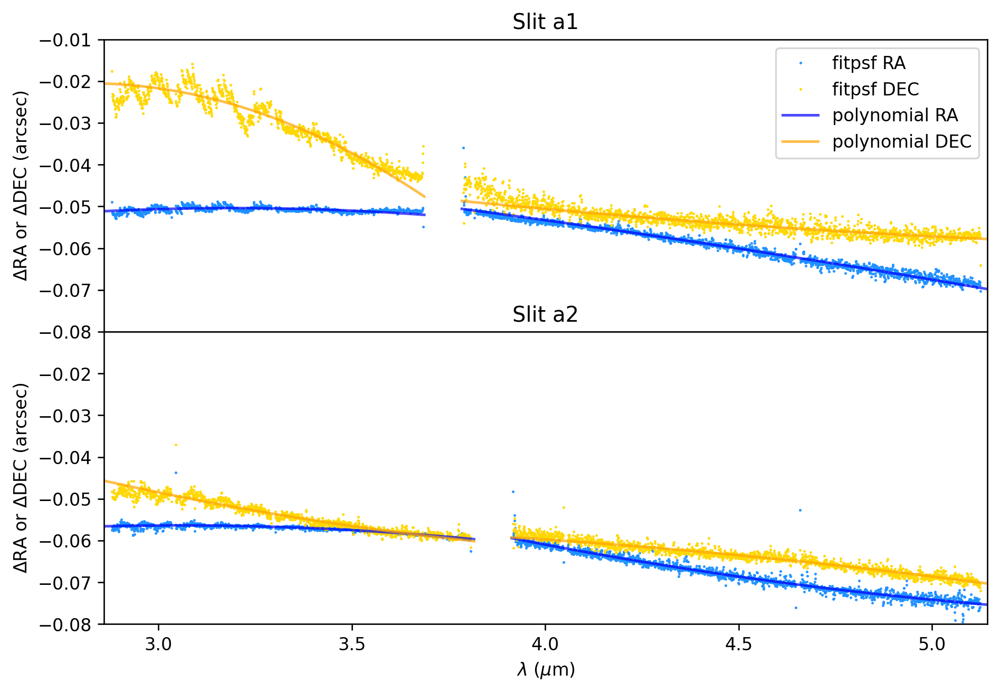

In [64]:
#plot coordinate corrections

fig,ax = plt.subplots(2,1,figsize=(9,6),dpi=240,sharex=True,sharey=False)

pk1 = ['a1','a2']
pk2 = ['n1','n2']
#pk3 = ['p','s','p','s']      
for j in range(2):
    for i in range(2):
        key = pk1[j] + pk2[i] #+ pk[j]
        print(key)
        offset = fitpsf_offsets[key] #fitpsf_offsets[key]
        hdu = fits.open(fitpsf_fnames[key])
        bfc = hdu[0].data
    
        #regwvs_obj = nonsub_regwvs_combdataobjs[key]
        wv_sampling = wv_sampling_s[key]
        
        dra = np.polyval(offset[0], wv_sampling - np.nanmedian(wv_sampling))
        ddec = np.polyval(offset[1], wv_sampling - np.nanmedian(wv_sampling))
    
        ax[j].plot(wv_sampling,bfc[0,:,2],'.',alpha=1,color='dodgerblue',markersize=1)
        ax[j].plot(wv_sampling,bfc[0,:,3],'.',alpha=1,color='gold',markersize=1)
        ax[j].plot(wv_sampling,dra,alpha=.7,color='blue')
        ax[j].plot(wv_sampling,ddec,alpha=.7,color='orange')
        ax[j].set_ylim([-0.09,0.04])
        ax[j].set_title('Slit '+pk1[j])
ax[0].legend(['fitpsf RA','fitpsf DEC','polynomial RA','polynomial DEC'])
plt.subplots_adjust(hspace=0)
plt.xlim([np.min(wv_sampling_s['a1n1']),np.max(wv_sampling_s['a1n2'])])
ax[0].set_ylabel(r'$\Delta$RA or $\Delta$DEC (arcsec)')
ax[1].set_ylabel(r'$\Delta$RA or $\Delta$DEC (arcsec)')

ax[0].set_ylim([-0.08,-.01])
ax[1].set_ylim([-0.08,-.01])
ax[1].set_yticks(np.linspace(-0.08,-.02,7))
ax[1].set_xlabel(r'$\lambda$ ($\mu$m)')
plt.show()

In [65]:
#checking new offset coords

for key in all_keys:
    print('________')
    print(key)
    regwvs_combdataobj = regwvs_objs[key]
    
    regwvs_combdataobj.set_coords2sky()

    offset = fitpsf_offsets[key[:-1]] #fitpsf_offsets[key[:-1]]
    silent(regwvs_combdataobj.apply_coords_offset)(np.array(offset))

    regwvs_combdataobj.set_coords2ifu()
    
    dra = regwvs_combdataobj.dra_as_array
    ddec = regwvs_combdataobj.ddec_as_array
    medra = np.nanmedian(regwvs_combdataobj.dra_as_array)
    meddec = np.nanmedian(regwvs_combdataobj.ddec_as_array)
    print(medra,meddec)

________
a1n1s
0.29418587156386733 0.046646259650786864
________
a1n2s
0.2969312583951446 0.022846077309940135
________
a2n1s
0.2970622185043572 -0.06054828863572739
________
a2n2s
0.28963586730936397 -0.07450841307977113
________
a1n1p
-0.2894009480755946 -0.04962277480521073
________
a1n2p
-0.2866598927737589 -0.07348603226983079
________
a2n1p
-0.28708492963337084 -0.15672480402188327
________
a2n2p
-0.2945145456587156 -0.17070636758231147


In [66]:
#estimating planet position in IFU coords

'''
where is the planet . com
RA Offset = 286.427 +/- 0.259 mas
Dec Offset = -84.467 +/- 0.224 mas
Separation = 298.605 +/- 0.299 mas
PA = 106.432 +/- 0.032 deg
Reference: GRAVITY (unpublished)
'''

from breads.utils import rotate_coordinates
skyra = .286427
skyra_sig = 0.259e-3

skydec = -.084467
skydec_sig = 0.224e-3

N = 100000
Xs = []
Ys = []
for _ in range(N):
    pm1 = np.random.normal()
    pm2 = np.random.normal()
    skyra_ = skyra+pm1*skyra_sig
    skydec_ = skydec+pm2*skydec_sig
    ifuX, ifuY = rotate_coordinates(skyra_, skydec_, AVG_east2V2_deg, flipx=False)
    Xs.append(ifuX)
    Ys.append(ifuY)

print('IFU X: {} +\- {} arcsec\nIFU Y: {} +\- {} arcsec'.format(
    np.round(np.mean(Xs),4),
    np.round(np.std(Xs),5),
    np.round(np.mean(Ys),4),
    np.round(np.std(Ys),5)))

IFU X: -0.2953 +\- 0.00025 arcsec
IFU Y: -0.0445 +\- 0.00023 arcsec


In [67]:
#defining vector to build cube on 

dec_vec = np.linspace(-.75,.75,61) + np.mean(Ys)
dec_vec[30]

-0.04449466974048062

In [68]:
#build spectral cube
save_base = 'saved/final/' #_noNSyes1f/'
if not os.path.exists(save_base):
    os.mkdir(save_base)

In [ ]:
for key in all_keys:
    print('________')
    print(key)
    regwvs_combdataobj = regwvs_objs[key]
    regwvs_combdataobj.set_coords2ifu()

    cube_filename = save_base+'cube_{}.fits'.format(key)

    dra = regwvs_combdataobj.dra_as_array
    ddec = regwvs_combdataobj.ddec_as_array
    medra = np.nanmedian(regwvs_combdataobj.dra_as_array)
    decmin = np.nanmin(regwvs_combdataobj.ddec_as_array)
    decmax = np.nanmax(regwvs_combdataobj.ddec_as_array)
    
    if 'p' in key:
        ra_vec = np.array([np.mean(Xs)])
    else:
        ra_vec = -np.array([np.mean(Xs)])
    
    t0 = time.time()
    webbpsf_reload = regwvs_combdataobj.reload_webbpsf_model()
    if webbpsf_reload is None:
        webbpsf_reload = regwvs_combdataobj.compute_webbpsf_model(
            wv_sampling=regwvs_combdataobj.wv_sampling,
            image_mask=None,
            pixelscale=0.1, oversample=10,
            parallelize=True,
            save_utils=True)
    wpsfs, wpsfs_header, wepsfs, webbpsf_wvs, webbpsf_X, webbpsf_Y, wpsf_oversample, wpsf_pixelscale = webbpsf_reload
    webbpsf_X = np.tile(webbpsf_X[None, :, :], (wepsfs.shape[0], 1, 1))
    webbpsf_Y = np.tile(webbpsf_Y[None, :, :], (wepsfs.shape[0], 1, 1))
    t1 = time.time()
    print('reload/compute _webbpsf_model ran in {} seconds...'.format(np.round(t1-t0)))
    
    t2 = time.time()
    pool = Pool()
    flux_cube,fluxerr_cube,ra_grid, dec_grid = \
        build_cube(regwvs_combdataobj, # combined point cloud
                   wepsfs, webbpsf_X, webbpsf_Y, # webbPSF model for flux extraction
                   ra_vec, dec_vec, # spatial sampling of final cube
                   out_filename=cube_filename,linear_interp=True,mppool=pool,aper_radius=0.15,
                   debug_init=None,debug_end=None)  # min max wavelength indices for partial extraction
    pool.close()
    t3 = time.time()
    print('build cube ran in {} seconds...'.format(np.round(t3-t2)))
print('done.')

________
a1n1s
reload/compute _webbpsf_model ran in 9.0 seconds...
Setting parallel_flag = True
debug range: 0 1226
prepping build_cube inputs... id: 1225 wave: 3.6874914169311523
starting parallel _build_cube_task...
computing _build_cube_task id: 1214 wave: 3.6800589561462402
cubing outputs... id: 1225 wave: 3.6874914169311523
saving saved/final_noNSyes1f/cube_a1n1s.fits
build cube ran in 266.0 seconds...
________
a1n2s
reload/compute _webbpsf_model ran in 12.0 seconds...
Setting parallel_flag = True
debug range: 0 2047
prepping build_cube inputs... id: 2046 wave: 5.1435379981994635
starting parallel _build_cube_task...
computing _build_cube_task id: 2039 wave: 5.1388883590698245
cubing outputs... id: 2046 wave: 5.1435379981994635
saving saved/final_noNSyes1f/cube_a1n2s.fits
build cube ran in 439.0 seconds...
________
a2n1s
reload/compute _webbpsf_model ran in 10.0 seconds...
Setting parallel_flag = True
debug range: 0 1416
prepping build_cube inputs... id: 1415 wave: 3.8161513805389

In [80]:
webbpsf_reload = regwvs_combdataobj.reload_webbpsf_model()
if webbpsf_reload is None:
    webbpsf_reload = regwvs_combdataobj.compute_webbpsf_model(
        wv_sampling=regwvs_combdataobj.wv_sampling,
        image_mask=None,
        pixelscale=0.1, oversample=10,
        parallelize=True,
        save_utils=True)
wpsfs, wpsfs_header, wepsfs, webbpsf_wvs, webbpsf_X, webbpsf_Y, wpsf_oversample, wpsf_pixelscale = webbpsf_reload
webbpsf_X = np.tile(webbpsf_X[None, :, :], (wepsfs.shape[0], 1, 1))
webbpsf_Y = np.tile(webbpsf_Y[None, :, :], (wepsfs.shape[0], 1, 1))

In [83]:
key = 'a2n2'
combdataobj = nonsub_regwvs_combdataobjs[key]
combdataobj.set_coords2sky()

offset = fitpsf_offsets[key]
silent(combdataobj.apply_coords_offset)(np.array(offset))

(array([[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]),
 array([[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]))

205.00025438627037
[-3.0, 3.0, -3.0, 3.0]


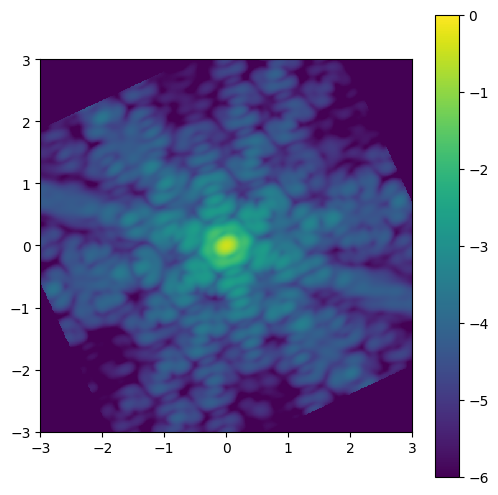

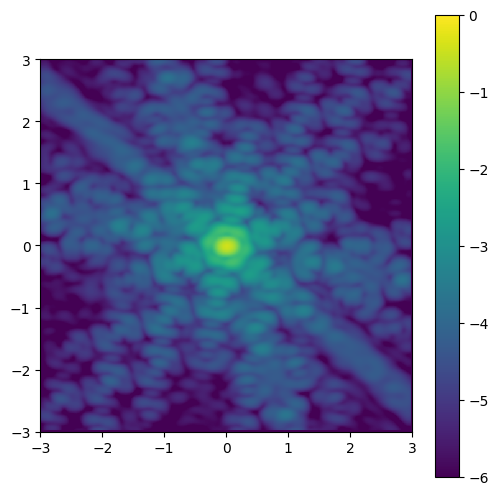

In [84]:
print(-combdataobj.east2V2_deg)

from breads.utils import rotate_coordinates
from scipy.interpolate import CloughTocher2DInterpolator

wv_ind =np.argmin(abs(webbpsf_wvs-lam))

ds = 4
wX, wY = rotate_coordinates(webbpsf_X[wv_ind,::ds,::ds].flatten(), webbpsf_Y[wv_ind,::ds,::ds].flatten(), -combdataobj.east2V2_deg, flipx=False)
wX_, wY_ = rotate_coordinates(webbpsf_X[wv_ind,::ds,::ds].flatten(), webbpsf_Y[wv_ind,::ds,::ds].flatten(), 0, flipx=False)

#ifuX, ifuY = rotate_coordinates(self.dra_as_array, self.ddec_as_array, self.east2V2_deg, flipx=False)

webbpsf_interp = CloughTocher2DInterpolator((wX, wY), wepsfs[wv_ind,::ds,::ds].flatten(),fill_value=1e-8)
webbpsf_interp_ = CloughTocher2DInterpolator((wX_, wY_), wepsfs[wv_ind,::ds,::ds].flatten(),fill_value=1e-8)

dra = 0.01
ddec = 0.01
ra_vec_ = np.arange(-3., 3., dra)
dec_vec_ = np.arange(-3., 3., ddec)
ra_grid, dec_grid = np.meshgrid(ra_vec_, dec_vec_)

interp = webbpsf_interp(ra_grid, dec_grid)
interp_ = webbpsf_interp_(ra_grid, dec_grid)
interp[interp<0] = 1e-8
interp_[interp_<0] = 1e-8

extent = [webbpsf_X[wv_ind,0,0],webbpsf_X[wv_ind,-1,-1],webbpsf_Y[wv_ind,0,0],webbpsf_Y[wv_ind,-1,-1]]
print(extent)
plt.figure(figsize=(6,6))
plt.imshow(np.log10(abs(interp)),aspect='equal',interpolation='nearest',vmin=-6,vmax=-0,alpha=1,extent=extent)
plt.colorbar()
plt.show()
plt.figure(figsize=(6,6))
plt.imshow(np.log10(abs(interp_)),aspect='equal',interpolation='nearest',vmin=-6,vmax=-0,alpha=1,extent=extent)
plt.colorbar()

In [109]:
ccf_planet_trace = np.load('ccf_planet_trace.npy')
ccf_speckle_trace = np.load('ccf_speckle_trace.npy')

In [110]:
from breads.jwst_tools.reduction_utils import get_2D_point_cloud_interpolator

lam = 4.7

combdataobj.set_coords2sky()
sky_pointcloud_interp = get_2D_point_cloud_interpolator(combdataobj,lam)

combdataobj.set_coords2ifu()
ifu_pointcloud_interp = get_2D_point_cloud_interpolator(combdataobj,lam)

0.11116133640714727


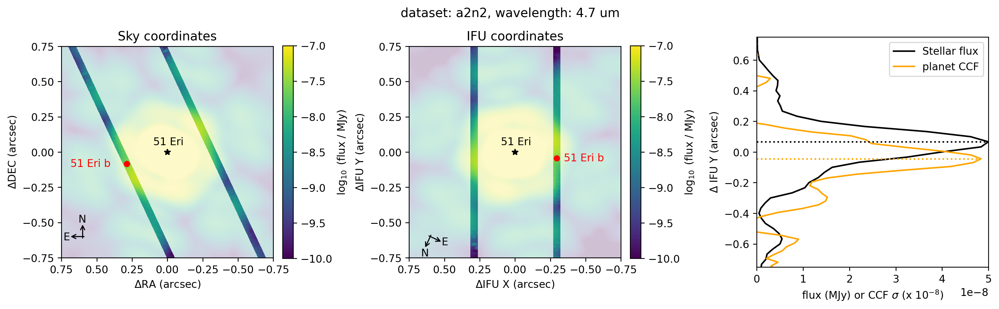

In [111]:


pointcloud_interp = get_2D_point_cloud_interpolator(combdataobj,lam)
ra = np.linspace(-3,3,4000)
dec =  np.linspace(-3,3,4000)
xx,yy = np.meshgrid(ra,dec)
out1 = sky_pointcloud_interp(xx,yy)
out2 = ifu_pointcloud_interp(xx,yy)

ra_s = [-np.mean(Xs)]
ra_p = [np.mean(Xs)]
dec_ = np.linspace(-1,1,61)
xx_p,yy_p = np.meshgrid(ra_p,dec_)
xx_s,yy_s = np.meshgrid(ra_s,dec_)
trace_p = ifu_pointcloud_interp(xx_p,yy_p)
trace_s = ifu_pointcloud_interp(xx_s,yy_s)


fig, ax = plt.subplots(1,3,figsize=(16,4),dpi=240)

ax[0].imshow(np.log10(abs(interp)),aspect='equal',interpolation='nearest',vmin=-4.75,vmax=-1.75,alpha=0.25,extent=extent)
ax[1].imshow(np.log10(abs(interp_)),aspect='equal',interpolation='nearest',vmin=-4.75,vmax=-1.75,alpha=0.25,extent=extent)

im = ax[0].imshow(np.log10(out1),interpolation='nearest',origin='lower',extent=[ra[0],ra[-1],dec[0],dec[-1]],vmin=-10,vmax=-7,cmap='viridis')
cbar = fig.colorbar(im,ax=ax[0],fraction=0.046, pad=0.04)
cbar.set_label(r'$\log_{10}$ (flux / MJy)')
ax[0].plot([0],[0],'k*')
ax[0].text(0.1,.05,'51 Eri')
ax[0].errorbar([skyra],[skydec],color='r',marker='.',markersize=10)
ax[0].text(skyra+0.4,skydec-0.02,'51 Eri b',color='r')


im = ax[1].imshow(np.log10(out2),interpolation='nearest',origin='lower',extent=[ra[0],ra[-1],dec[0],dec[-1]],vmin=-10,vmax=-7,cmap='viridis')
cbar = fig.colorbar(im,ax=ax[1],fraction=0.046, pad=0.04)
cbar.set_label(r'$\log_{10}$ (flux / MJy)')
ax[1].plot([0],[0],'k*')
ax[1].text(0.1,.05,'51 Eri')
ax[1].errorbar(np.mean(Xs),np.mean(Ys),color='r',marker='.',markersize=10)
ax[1].text(np.mean(Xs)-0.05,np.mean(Ys)-.02,'51 Eri b',color='r')

l1, = ax[2].plot(trace_p,dec_,'black')
#l2, = ax[2].plot(trace_s,dec_,'green')
l2, = ax[2].plot(ccf_planet_trace*1e-8,np.flip(dec_vec),'orange')
#l3, = ax[2].plot(ccf_speckle_trace*1e-8,np.flip(dec_vec),'blue')
yflux = dec_[np.argmax(trace_p)]
_pi = np.argmax(ccf_planet_trace)
_si = np.argmax(ccf_speckle_trace)
ypccf = np.flip(dec_vec)[_pi]
ysccf = np.flip(dec_vec)[_si]
print(yflux-ypccf)
l4 = ax[2].axhline(y=yflux,color='black',linestyle=':')
#l5 = ax[2].axhline(y=np.mean(Ys),color='red',linestyle='-')
l6 = ax[2].axhline(y=ypccf,xmax=ccf_planet_trace[_pi]/5,color='orange',linestyle=':')
#l7 = ax[2].axhline(y=ysccf,xmax=ccf_speckle_trace[_si]/5,color='blue',linestyle=':')


ax[2].legend([l1,l2],['Stellar flux','planet CCF'])

ax[2].set_ylabel(r'$\Delta$ IFU Y (arcsec)')
ax[2].set_xlabel(r'flux (MJy) or CCF $\sigma$ (x 10$^{-8}$)')
ax[2].set_xlim([0,5e-8])

ax[0].set_title('Sky coordinates')
ax[1].set_title('IFU coordinates')

plt.suptitle('dataset: {}, wavelength: {} um'.format(key,lam))
l = .75
ax[0].set_xlim([l,-l])
ax[0].set_ylim([-l,l])

ax[1].set_xlim([l,-l])
ax[1].set_ylim([-l,l])

ax[2].set_ylim([-l,l])

for _i  in [0,1]:
    ax[_i].set_xticks(np.arange(-l,l+.1,0.25))
    ax[_i].set_yticks(np.arange(-l,l+.1,0.25))

ax[0].set_xlabel(r'$\Delta$RA (arcsec)')
ax[0].set_ylabel(r'$\Delta$DEC (arcsec)')

ax[1].set_xlabel(r'$\Delta$IFU X (arcsec)')
ax[1].set_ylabel(r'$\Delta$IFU Y (arcsec)')

NEvec_0 = [0,-0.025]
NEvec_1 = [-0.025,0]
NEvec_2 = [0,0.1]
NEvec_3 = [0.1,0]
offset = np.array([0.6,-0.6])
ax[0].annotate("", xytext=np.array(NEvec_0)+offset, xy=np.array(NEvec_2)+offset,arrowprops=dict(arrowstyle="->"))
ax[0].annotate("", xytext=np.array(NEvec_1)+offset, xy=np.array(NEvec_3)+offset,arrowprops=dict(arrowstyle="->"))
a,b = rotate_coordinates([NEvec_0[0],NEvec_1[0]], [NEvec_0[1],NEvec_1[1]], combdataobj.east2V2_deg, flipx=False)
c,d = rotate_coordinates([NEvec_2[0],NEvec_3[0]], [NEvec_2[1],NEvec_3[1]], combdataobj.east2V2_deg, flipx=False)
ax[1].annotate("", xytext=np.array(a)+offset, xy=c+offset,arrowprops=dict(arrowstyle="->"))
ax[1].annotate("", xytext=np.array(b)+offset, xy=d+offset,arrowprops=dict(arrowstyle="->"))

ax[0].text(0.63,-.5,'N')
ax[0].text(0.735,-.625,'E')
ax[1].text(0.665,-.74,'N')
ax[1].text(0.52,-.66,'E')

plt.subplots_adjust(wspace=0.5)
plt.show()